In [1]:
import scanpy as sc
import os
import anndata as ad
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
sc.settings.verbosity=0 # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.n_jobs=4
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42

%matplotlib inline




In [2]:
sc.settings.figdir = "fig4"



In [3]:
sc.settings.set_figure_params(dpi=300, facecolor="white", frameon=False, figsize=(4,4))


In [4]:
PATH='/nfs/team298/ls34/fibroblast_atlas_paper/final_adatas/adata_lesional11.h5ad'
adata_lesional=sc.read_h5ad(PATH)

In [5]:
adata_i=adata_lesional[adata_lesional.obs["Patient_status2"]!="Neurofibroma"]
 

In [6]:
counts = adata_i.obs["test13"].value_counts()
categories_to_keep = counts[counts >= 10].index
adata_i = adata_i[adata_i.obs["test13"].isin(categories_to_keep)].copy()


In [7]:
kirstin = {"Fibroblast general": ["PDGFRA", "LUM", "DCN"],
           'F2/3: Bridge': ['CXCL12', 'APOE', 'EFEMP1', #'GGT5', 
                                    "APOC1", "C7", "PLA2G2A",   'PPARG', 
                                          #'IL1RL1', 'MARCH3', 'PCSK1', 
                                          
                                          
                                          # "FMO1", 
                                          
                                   # "PPARG", "TNFSF14"
                           "MYOC", "GDF10", # "LINC-PINT", 
                             # "POU3F3", 
                                  # "TNNT3", 
                    ],
                      "F5+: RAMP1": ["RAMP1", "RELN", 'PLEKHA6',  "IGFBP2", 'SFRP1', #"COL26A1", #"TAC1"
                                   ], #"CPE", "PTN", "IGF1", 

 'F5: NGFR+': [  'EBF2', "NGFR",  'SFRP4',# "TENM2", #"TM4SF1", "ANGPTL7",  
               "ITGA6", "CDH19",  "CLDN1", #"FOXS1", #"SOX17",
                 #"CAVIN2", "SFRP5", #"TNNC1"
                
                     ],
           "F5 Unique": [ 'PLEKHA6','EBF2', 'TENM2','PEAR1',  #'APOD', 'CYP1B1',
                      ],
           
          
         #  'endoneurial NAF': ['SOX9', 'OSR2', 'P4HB', 'CSPG4', 'CD34', "PDGFRB"],
        #   'perineurial NAF': ['SLC2A1', 'ITGA6',],
         
        #   "Pericyte": ["RGS5"]
          }
sc.settings.set_figure_params(dpi=600, facecolor="white", frameon=False, figsize=(8,8))

sc.pl.dotplot(
    adata_i,
    kirstin, cmap="Reds",
    groupby="test13",vmax=1,colorbar_title='Mean expression\n(variance scaled)',
    standard_scale="var", 
    dendrogram=False,
    save="fig4_neurofibroma.pdf"
)   

/home/jovyan/my-conda-envs/sko_ls/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
/home/jovyan/my-conda-envs/sko_ls/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
/home/jovyan/my-conda-envs/sko_ls/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(

In [8]:
# kirstin = {"Fibroblast general": ["PDGFRA", "LUM", "DCN"],
#                       "F5+: RAMP1": ["RAMP1", "RELN", 'PLEKHA6',  "IGFBP2", 'SFRP1', #"COL26A1", #"TAC1"
#                                    ], #"CPE", "PTN", "IGF1", 

#  'F5: NGFR+': [  'EBF2', "NGFR",  'SFRP4',# "TENM2", #"TM4SF1", "ANGPTL7",  
#                "ITGA6", "CDH19",  "CLDN1", #"FOXS1", #"SOX17",
#                  #"CAVIN2", "SFRP5", #"TNNC1"
                
#                      ],
#            "F5 Unique": [ 'PLEKHA6','EBF2', 'TENM2','PEAR1',  #'APOD', 'CYP1B1',
#                       ],
           
          
#          #  'endoneurial NAF': ['SOX9', 'OSR2', 'P4HB', 'CSPG4', 'CD34', "PDGFRB"],
#         #   'perineurial NAF': ['SLC2A1', 'ITGA6',],
         
#         #   "Pericyte": ["RGS5"]
#           }
# adata_i=adata_i[adata_i.obs["test13"].str.startswith("F5")]
# #adata_i.obs["neurofb"]=[x if x.startswith("F2") else "F5: Schwann-like" for x in adata_i.obs["test13"]]
# sc.pl.dotplot(
#     adata_i,
#     kirstin, cmap="Reds",
#     groupby="test13",vmax=1.1,colorbar_title='Mean expression\n(log1p norm)',
#    # standard_scale="var", 
#     dendrogram=False,
# )   

In [9]:
# adata_lesional2=adata_lesional[adata_lesional.obs["test13"]=="F6: Myofibroblast"]

# sc.pl.dotplot(
#     adata_lesional2,
#     "CXCL13", cmap="Reds",
#     groupby="Patient_status2",vmax=2,colorbar_title='Mean expression\n(log1p norm)',
#     #tandard_scale="var", 
#     dendrogram=False,
#     #save="fig4_cxcl13.png"
#        # swap_axes=True,
#     dot_max=0.4,

# )   

# icaf

In [10]:
# CAF_GENES = {"myCAF": ["COL1A1", "MRPS6", 'COL1A2', "COL3A1", "CTHRC1", "LRRC15", "FAP", "POSTN", "TNC", "CRABP1","MMP11","MASP1", "COL11A1", "PTGDS" ],
#              "iCAF": ['MMP1', 'MMP3', 'CXCL8', 'IDO1', 'IL24', 'CHI3L1', 'SAT1', 'UBD', 'WARS'],
#             }
# adata_lesional2 = adata_lesional[(adata_lesional.obs["test13"].str.startswith("F6")) | 
#                                  (adata_lesional.obs["test13"].str.startswith("F7")) 
#                                 ]

# sc.pl.matrixplot(
#     adata_lesional2,
#     CAF_GENES,
#     groupby="test13",
#     standard_scale="var",
#     vmax=1,colorbar_title='Mean expression\n(variance scaled)', 
#     dendrogram=False,
#         cmap="Reds",
#     swap_axes=True,
#     save='mycaf_icaf.pdf'
#    # dot_max=1,
# ) 
 

# gene module

In [11]:
# GENES0 =  ['MMP1', 'MMP3', 'CXCL8', 'IDO1', 'IL24',]


In [12]:
# adata_lesional.obs["test13"].value_counts()

In [13]:
# adata_ii=adata_lesional[adata_lesional.obs["test13"].str.startswith("F6")]
# GENES0 = ['CXCL8',
#   'CXCL5',
#   'CXCL13',
#   'IL11',
#   'IL24',
#   'MMP1',
#   'MMP3',
#   'IL7R',
#   'INHBA',
#   'CSF3',
#   'TDO2',
#   'WWC1',
#   'CHI3L1',
#   'STAT4',
#   'CCL5',
#   'CCL3',
#   'FAM167A']




In [14]:
# import seaborn as sns
# import matplotlib.pyplot as plt
# import pandas as pd

# # Example ORDER list (you can replace this with your actual list)
# ORDER = [
#     'Squamous cell carcinoma',
#     'Basal cell carcinoma', 'Cutaneous melanoma',
#     'Acral melanoma',
#     'Acne',
#     'Hidradenitis suppurativa', 'Sarcoidosis',
#     'Granuloma annulare', 'Sarcoidosis',
#     'Lupus (DLE)',
#     'Psoriasis',
#     'Prurigo nodularis',
#     'Eczema', 'Alopecia areata', 'Lupus (SCLE)',
#     'Drug reaction: lichenoid',
#     'Drug reaction: DRESS',
#     'Erythema migrans',
#     'Keloid scar', "Dupuytren contracture", 'Non-keloid scar', 'Systemic sclerosis', 'Morphoea (pansclerotic)',
# ]

# # def plot_matrix(cluster_scores, cmap="viridis", normalisation=None, colorbar_ticks=[0, 0.5, 1], dataset_name="Prenatal Fibroblasts",
# #                reorder_dict=None, reorder_list=ORDER, FIGSIZE=(0.5, 10)):
# #     max_score = cluster_scores.max().max()

# #     # Reordering based on provided list
# #     if reorder_list:
# #         # Ensure the order of rows matches the ORDER list
# #         cluster_scores = cluster_scores.loc[reorder_list]

# #     if reorder_dict:
# #         cluster_scores.rename(index=reorder_dict, inplace=True)  

# #     # Normalization method
# #     if not normalisation:
# #         cluster_scores_normalized = cluster_scores
# #     else:
# #         if normalisation == "max":
# #             cluster_scores_normalized = cluster_scores / max_score
# #         elif normalisation == "minmax":
# #             cluster_scores_normalized = (cluster_scores - cluster_scores.min()) / (cluster_scores.max() - cluster_scores.min())
# #         elif normalisation == "row":
# #             cluster_scores_normalized = cluster_scores.div(cluster_scores.max(axis=0), axis=1)
# #         elif normalisation == "col":
# #             cluster_scores_normalized = cluster_scores.div(cluster_scores.max(axis=1), axis=0)
# #         else:
# #             print("Not valid normalisation method. Choose from ['max', 'minmax', 'row', 'col']")
    
# #     fig, ax = plt.subplots(figsize=FIGSIZE)

# #     sns.heatmap(cluster_scores_normalized.T,  # Transpose the matrix to rotate
# #                 cmap=cmap,
# #                 linewidths=0.1,  # Space between boxes
# #                 linecolor='white',  # Make gridlines invisible
# #                 cbar_kws={"label": "Gene module\nscore"},
# #                 vmin=0,
# #                 ax=ax)

# #     # Remove the gridlines
# #     ax.grid(False)

# #     # Set custom order for the columns (x-axis) based on Patient_status2
# #     ax.set_xticks([i + 0.5 for i in range(len(cluster_scores_normalized.columns))])  # Adjust x-ticks based on custom order
# #     ax.set_xticklabels(cluster_scores_normalized.columns, fontsize=12, ha='center')  # Set custom order for x-axis

# #     # Set custom order for the rows (y-axis)
# #     ax.set_yticks([i + 0.5 for i in range(len(reorder_list))])  # Adjust y-ticks based on custom order
# #     ax.set_yticklabels(reorder_list, fontsize=8, va='center')  # Set custom order for y-axis

# #     plt.title(normalisation, fontsize=8)  
# #     plt.xlabel(dataset_name, fontsize=8)  
# #     plt.ylabel("", fontsize=8)  

# #     plt.tight_layout()  
# #     plt.savefig("figures/gene_modules_horizontal.pdf", dpi=300, bbox_inches="tight")  
# #     plt.show()

# # # Call the plotting function with the ORDER list to reorder
# # plot_matrix(cluster_scores, cmap="Blues", normalisation="minmax", colorbar_ticks=[0, 0.5, 1], FIGSIZE=(0.5, 10), dataset_name="")

In [15]:
# import seaborn as sns
# import matplotlib.pyplot as plt
# import pandas as pd

# # # Example ORDER list (you can replace this with your actual list)
# # ORDER = [
# #     'Squamous cell carcinoma',
# #     'Basal cell carcinoma', 'Cutaneous melanoma',
# #     'Acral melanoma',
# #     'Acne',
# #     'Hidradenitis supparativa', 'Sarcoidosis',
# #     'Granuloma annulare', 'Sarcoidosis',
# #     'Lupus (DLE)',
# #     'Psoriasis',
# #     'Prurigo nodularis',
# #     'Eczema', 'Alopecia areata', 'Lupus (SCLE)',
# #     'Drug reaction: lichenoid',
# #     'Drug reaction: DRESS',
# #     'Erythema migrans',
# #     'Keloid scar', "Dupuytren's", 'Non-keloid scar', 'Systemic sclerosis', 'Morphoea (pansclerotic)',
# # ]

# def plot_matrix(cluster_scores, cmap="viridis", normalisation=None, colorbar_ticks=[0, 0.5, 1], dataset_name="Prenatal Fibroblasts",
#                reorder_dict=None, reorder_list=ORDER, FIGSIZE=(0.5, 10)):
#     max_score = cluster_scores.max().max()

#     # Reordering based on provided list
#     if reorder_list:
#         # Ensure the order of rows matches the ORDER list
#         cluster_scores = cluster_scores.loc[reorder_list]

#     if reorder_dict:
#         cluster_scores.rename(index=reorder_dict, inplace=True)  

#     # Normalization method
#     if not normalisation:
#         cluster_scores_normalized = cluster_scores
#     else:
#         if normalisation == "max":
#             cluster_scores_normalized = cluster_scores / max_score
#         elif normalisation == "minmax":
#             cluster_scores_normalized = (cluster_scores - cluster_scores.min()) / (cluster_scores.max() - cluster_scores.min())
#         elif normalisation == "row":
#             cluster_scores_normalized = cluster_scores.div(cluster_scores.max(axis=0), axis=1)
#         elif normalisation == "col":
#             cluster_scores_normalized = cluster_scores.div(cluster_scores.max(axis=1), axis=0)
#         else:
#             print("Not valid normalisation method. Choose from ['max', 'minmax', 'row', 'col']")
    
#     fig, ax = plt.subplots(figsize=FIGSIZE)

#     sns.heatmap(cluster_scores_normalized,  # No transpose
#                 cmap=cmap,
#                 linewidths=0.1,  # Space between boxes
#                 linecolor='white',  # Make gridlines invisible
#                 cbar_kws={"label": "Gene module\nscore"},
#                 vmin=0,
#                 ax=ax)

#     # Remove the gridlines
#     ax.grid(False)

#     # Set custom order for the rows (y-axis)
#     ax.set_yticks([i + 0.5 for i in range(len(cluster_scores_normalized.index))])  # Adjust y-ticks based on custom order
#     ax.set_yticklabels(cluster_scores_normalized.index, fontsize=12, va='center')  # Set custom order

#     ax.set_xticks([])  # Hide x-ticks

#     plt.title(normalisation, fontsize=14)  
#     plt.xlabel(dataset_name, fontsize=14)  
#     plt.ylabel("", fontsize=14)  

#     plt.tight_layout()  
#     plt.savefig("figures/gene_modules_vertical.pdf", dpi=300, bbox_inches="tight")  
#     plt.show()

# # Call the plotting function with the ORDER list to reorder
# plot_matrix(cluster_scores, cmap="Blues", normalisation="minmax", colorbar_ticks=[0, 0.5, 1], FIGSIZE=(0.5, 10), dataset_name="")

In [16]:
# # ORDER = [ 'Squamous cell carcinoma',

# #  'Basal cell carcinoma', 'Cutaneous melanoma',
# #      'Acral melanoma',
# #  'Acne',
# #      'Hidradenitis supparativa', 'Sarcoidosis',
# #  'Granuloma annulare', 'Sarcoidosis',


# #  'Lupus (DLE)',







# #  'Psoriasis',
# #  'Prurigo nodularis',
# #  'Eczema', 'Alopecia areata', 'Lupus (SCLE)',

# # 'Drug reaction: lichenoid',
# #  'Drug reaction: DRESS',
# #  'Erythema migrans',


# #  'Keloid scar',  "Dupuytren's",    'Non-keloid scar', 'Systemic sclerosis', 'Morphoea (pansclerotic)',
# # ]
# cluster_scores=cluster_scores.loc[ORDER]

In [17]:
# import seaborn as sns
# import matplotlib.pyplot as plt

# # Define your custom order
# ORDER = [
#     'Squamous cell carcinoma',
#     'Basal cell carcinoma', 'Cutaneous melanoma',
#     'Acral melanoma',
#     'Acne',
#     'Hidradenitis supparativa', 'Sarcoidosis',
#     'Granuloma annulare', 'Sarcoidosis',
#     'Lupus (DLE)',
#     'Psoriasis',
#     'Prurigo nodularis',
#     'Eczema', 'Alopecia areata', 'Lupus (SCLE)',
#     'Drug reaction: lichenoid',
#     'Drug reaction: DRESS',
#     'Erythema migrans',
#     'Keloid scar', "Dupuytren's", 'Non-keloid scar', 'Systemic sclerosis', 'Morphoea (pansclerotic)',
# ]

# def plot_matrix(cluster_scores, cmap="viridis", normalisation=None, colorbar_ticks=[0, 0.5, 1], dataset_name="Prenatal Fibroblasts",
#                reorder_dict=None, reorder_list=None, FIGSIZE=(10, 0.5)):
#     max_score = cluster_scores.max().max()
    
#     if reorder_list:
#         cluster_scores = cluster_scores.loc[reorder_list]
#     if reorder_dict:
#         cluster_scores.rename(columns=reorder_dict, inplace=True)
    
#     if not normalisation:
#         cluster_scores_normalized = cluster_scores
#     else:
#         if normalisation == "max":
#             cluster_scores_normalized = cluster_scores / max_score
#         elif normalisation == "minmax":
#             cluster_scores_normalized = (cluster_scores - cluster_scores.min()) / (cluster_scores.max() - cluster_scores.min())
#         elif normalisation == "row":
#             cluster_scores_normalized = cluster_scores.div(cluster_scores.max(axis=0), axis=1)
#         elif normalisation == "col":
#             cluster_scores_normalized = cluster_scores.div(cluster_scores.max(axis=1), axis=0)
#         else:
#             print("Not valid normalisation method. Choose from ['max', 'minmax', 'row', 'col']")
    
#     fig, ax = plt.subplots(figsize=FIGSIZE)
    
#     # Heatmap plotting with small space between each box
#     sns.heatmap(cluster_scores_normalized.T,  
#                 cmap=cmap,
#                 linewidths=0.1,  # Keep small space between boxes
#                 linecolor='white',  # Make the line color white to avoid gray lines
#                 cbar_kws={"label": "Gene module\nscore"},
#                 vmin=0,
#                 ax=ax,
#                 square=True,
#                 xticklabels=False,  # Hide x-tick labels
#                 yticklabels=False)  # Hide y-tick labels
    
#     # Disable gridlines completely on the axis
#     ax.grid(False)

#     cbar = ax.collections[0].colorbar
#     cbar.set_ticks(colorbar_ticks)
#     cbar.set_ticklabels(colorbar_ticks)
    
#     # Set the custom order on the y-axis (rows)
#     ax.set_xticks([i + 0.5 for i in range(len(cluster_scores_normalized.index))])
#     ax.set_xticklabels(cluster_scores_normalized.index, rotation=90, fontsize=12, ha='center')  
    
#     ax.set_yticks([i + 0.5 for i in range(len(ORDER))])  # Adjust y-ticks based on custom order
#     ax.set_yticklabels(ORDER, fontsize=12, va='center')  # Set custom order

#     plt.title(normalisation, fontsize=14)  
#     plt.xlabel(dataset_name, fontsize=14)  
#     plt.ylabel("", fontsize=14)  

#     plt.tight_layout()  
#     plt.savefig("figures/gene_modules.pdf", dpi=300, bbox_inches="tight")  
#     plt.show()

# # Example call to the function with the custom order applied
# plot_matrix(cluster_scores, cmap="bwr", normalisation="minmax", colorbar_ticks=[0, 0.5, 1], FIGSIZE=(10, 0.5), dataset_name="")

In [18]:
# import seaborn as sns
# import matplotlib.pyplot as plt

# def plot_matrix(cluster_scores, cmap="viridis", normalisation=None, colorbar_ticks=[0, 0.5, 1], dataset_name="Prenatal Fibroblasts",
#                reorder_dict=None, reorder_list=None, FIGSIZE=(10, 0.5)):
#     max_score = cluster_scores.max().max()
    
#     if reorder_list:
#         cluster_scores = cluster_scores.loc[reorder_list]
#     if reorder_dict:
#         cluster_scores.rename(columns=reorder_dict, inplace=True)
    
#     if not normalisation:
#         cluster_scores_normalized = cluster_scores
#     else:
#         if normalisation == "max":
#             cluster_scores_normalized = cluster_scores / max_score
#         elif normalisation == "minmax":
#             cluster_scores_normalized = (cluster_scores - cluster_scores.min()) / (cluster_scores.max() - cluster_scores.min())
#         elif normalisation == "row":
#             cluster_scores_normalized = cluster_scores.div(cluster_scores.max(axis=0), axis=1)
#         elif normalisation == "col":
#             cluster_scores_normalized = cluster_scores.div(cluster_scores.max(axis=1), axis=0)
#         else:
#             print("Not valid normalisation method. Choose from ['max', 'minmax', 'row', 'col']")
    
#     fig, ax = plt.subplots(figsize=FIGSIZE)
    
#     # Heatmap plotting without lines and ticks
#     sns.heatmap(cluster_scores_normalized.T,  
#                 cmap=cmap,
#                 linewidths=0,  # No gridlines between cells
#                 cbar_kws={"label": "Gene module\nscore"},
#                 vmin=0,
#                 ax=ax,
#                 square=True,
#                 xticklabels=False,  # Hide x-tick labels
#                 yticklabels=False)  # Hide y-tick labels
    
#     # Disable gridlines completely on the axis
#     ax.grid(False)

#     cbar = ax.collections[0].colorbar
#     cbar.set_ticks(colorbar_ticks)
#     cbar.set_ticklabels(colorbar_ticks)
    
#     ax.set_xticks([i + 0.5 for i in range(len(cluster_scores_normalized.index))])
#     ax.set_xticklabels(cluster_scores_normalized.index, rotation=90, fontsize=12, ha='center')  
    
#     ax.set_yticks([])  

#     plt.title(normalisation, fontsize=14)  
#     plt.xlabel(dataset_name, fontsize=14)  
#     plt.ylabel("", fontsize=14)  

#     plt.tight_layout()  
#     plt.savefig("figures/gene_modules.pdf", dpi=300, bbox_inches="tight")  
#     plt.show()

# # Example call to the function
# plot_matrix(cluster_scores, cmap="bwr", normalisation="minmax", colorbar_ticks=[0, 0.5, 1], FIGSIZE=(10, 0.5), dataset_name="")


# # ORDER = [
# #     'Squamous cell carcinoma',
# #     'Basal cell carcinoma', 'Cutaneous melanoma',
# #     'Acral melanoma',
# #     'Acne',
# #     'Hidradenitis supparativa', 'Sarcoidosis',
# #     'Granuloma annulare', 'Sarcoidosis',
# #     'Lupus (DLE)',
# #     'Psoriasis',
# #     'Prurigo nodularis',
# #     'Eczema', 'Alopecia areata', 'Lupus (SCLE)',
# #     'Drug reaction: lichenoid',
# #     'Drug reaction: DRESS',
# #     'Erythema migrans',
# #     'Keloid scar', "Dupuytren's", 'Non-keloid scar', 'Systemic sclerosis', 'Morphoea (pansclerotic)',
# # ]


In [19]:
# import seaborn as sns
# import matplotlib.pyplot as plt

# # # ORDER list for row reordering
# # ORDER = [
# #     'Squamous cell carcinoma',
# #     'Basal cell carcinoma', 'Cutaneous melanoma',
# #     'Acral melanoma',
# #     'Acne',
# #     'Hidradenitis suppurativa', 'Sarcoidosis',
# #     'Granuloma annulare', 'Sarcoidosis',
# #     'Lupus (DLE)',
# #     'Psoriasis',
# #     'Prurigo nodularis',
# #     'Eczema', 'Alopecia areata', 'Lupus (SCLE)',
# #     'Drug reaction: lichenoid',
# #     'Drug reaction: DRESS',
# #     'Erythema migrans',
# #     'Keloid scar', "Dupuytren contracture", 'Non-keloid scar', 'Systemic sclerosis', 'Morphoea (pansclerotic)',
# # ]

# def plot_matrix(cluster_scores, cmap="viridis", normalisation=None, colorbar_ticks=[0, 0.5, 1], dataset_name="Prenatal Fibroblasts",
#                reorder_dict=None, reorder_list=ORDER, FIGSIZE=(10, 0.5)):
#     max_score = cluster_scores.max().max()
    
#     # Reorder based on ORDER list if available
#     if reorder_list:
#         cluster_scores = cluster_scores.loc[reorder_list]

#     if reorder_dict:
#         # Rename columns if reorder_dict is provided
#         cluster_scores.rename(columns=reorder_dict, inplace=True)
    
#     # Change "Stroma_MCP" to "F6: Inflammatory myofibroblast signature" in column names
#     cluster_scores.rename(columns=lambda x: x.replace("Stroma_MCP", "F6: Inflammatory myofibroblast\nsignature"), inplace=True)

#     # Apply normalization if specified
#     if not normalisation:
#         cluster_scores_normalized = cluster_scores
#     else:
#         if normalisation == "max":
#             cluster_scores_normalized = cluster_scores / max_score
#         elif normalisation == "minmax":
#             cluster_scores_normalized = (cluster_scores - cluster_scores.min()) / (cluster_scores.max() - cluster_scores.min())
#         elif normalisation == "row":
#             cluster_scores_normalized = cluster_scores.div(cluster_scores.max(axis=0), axis=1)
#         elif normalisation == "col":
#             cluster_scores_normalized = cluster_scores.div(cluster_scores.max(axis=1), axis=0)
#         else:
#             print("Not valid normalisation method. Choose from ['max', 'minmax', 'row', 'col']")
    
#     fig, ax = plt.subplots(figsize=FIGSIZE)
    
#     # Plot the heatmap (transpose to put Patient_status2 on x-axis)
#     sns.heatmap(cluster_scores_normalized.T,  # Transpose to place Patient_status2 on the x-axis
#                 cmap=cmap,
#                 linewidths=0.5,  # Add a tiny bit of space between boxes (adjust linewidths)
#                 linecolor='white',  # White color for the spaces
#                 cbar_kws={"label": "Gene module\nscore"},
#                 vmin=0,
#                 ax=ax,
#                 square=False,  # No need for a square plot
#                 xticklabels=False,  # Hide x-tick labels
#                 yticklabels=False)  # Hide y-tick labels
    
#     # Remove gridlines completely
#     ax.grid(False)

#     # Adjust the colorbar ticks
#     cbar = ax.collections[0].colorbar
#     cbar.set_ticks(colorbar_ticks)
#     cbar.set_ticklabels(colorbar_ticks)
    
#     # Set x-ticks and labels based on cluster_scores.index (which is now Patient_status2)
#     ax.set_xticks([i + 0.5 for i in range(len(cluster_scores_normalized.index))])  # Adjust x-ticks based on custom order
#     ax.set_xticklabels(cluster_scores_normalized.index, rotation=90, fontsize=12, ha='center')  # Set custom order for x-axis

#     # Set y-ticks and labels based on reorder_list (which corresponds to the rows)
#     ax.set_yticks([i + 0.5 for i in range(len(cluster_scores_normalized.columns))])  # Adjust y-ticks based on custom order
#     ax.set_yticklabels(cluster_scores_normalized.columns, fontsize=12, va='center')  # Set custom order for y-axis labels
    
#     plt.title(normalisation, fontsize=14)  
#     plt.xlabel(dataset_name, fontsize=14)  
#     plt.ylabel("", fontsize=14)  

#     plt.tight_layout()  
#     plt.savefig("figures/gene_modules_reordered_with_spacing.pdf", dpi=300, bbox_inches="tight")  
#     plt.show()

# # Example call to the function
# plot_matrix(cluster_scores, cmap="bwr", normalisation="minmax", colorbar_ticks=[0, 0.5, 1], FIGSIZE=(10, 0.5), dataset_name="")

In [20]:
# plot_matrix(cluster_scores, cmap="Reds", normalisation="minmax", colorbar_ticks=[0, 0.5, 1], FIGSIZE=(10, 0.5), dataset_name="")

In [21]:
# plot_matrix(cluster_scores, cmap="Blues", normalisation="minmax", colorbar_ticks=[0, 0.5, 1], FIGSIZE=(10, 0.5), dataset_name="")

In [22]:

# # import seaborn as sns
# # import matplotlib.pyplot as plt
# import matplotlib.patches as patches

# # # ORDER list for row reordering
# # ORDER = [
# #     'Squamous cell carcinoma',
# #     'Basal cell carcinoma', 'Cutaneous melanoma',
# #     'Acral melanoma',
# #     'Acne',
# #     'Hidradenitis supparativa', 'Sarcoidosis',
# #     'Granuloma annulare', 'Sarcoidosis',
# #     'Lupus (DLE)',
# #     'Psoriasis',
# #     'Prurigo nodularis',
# #     'Eczema', 'Alopecia areata', 'Lupus (SCLE)',
# #     'Drug reaction: lichenoid',
# #     'Drug reaction: DRESS',
# #     'Erythema migrans',
# #     'Keloid scar', "Dupuytren's", 'Non-keloid scar', 'Systemic sclerosis', 'Morphoea (pansclerotic)',
# # ]

# def plot_matrix(cluster_scores, cmap="viridis", normalisation=None, colorbar_ticks=[0, 0.5, 1], dataset_name="Prenatal Fibroblasts",
#                reorder_dict=None, reorder_list=ORDER, FIGSIZE=(10, 0.5), LABEL2="F6: Inflammatory myofibroblast\nsignature"):
#     max_score = cluster_scores.max().max()
    
#     # Reorder based on ORDER list if available
#     reorder_list=[x for x in reorder_list if x in cluster_scores.index]
#     if reorder_list:
#         cluster_scores = cluster_scores.loc[reorder_list]

#     if reorder_dict:
#         # Rename columns if reorder_dict is provided
#         cluster_scores.rename(columns=reorder_dict, inplace=True)
    
#     # Change "Stroma_MCP" to "F6: Inflammatory myofibroblast signature" in column names
#     cluster_scores.rename(columns=lambda x: x.replace("Stroma_MCP", LABEL2), inplace=True)

#     # Apply normalization if specified
#     if not normalisation:
#         cluster_scores_normalized = cluster_scores
#     else:
#         if normalisation == "max":
#             cluster_scores_normalized = cluster_scores / max_score
#         elif normalisation == "minmax":
#             cluster_scores_normalized = (cluster_scores - cluster_scores.min()) / (cluster_scores.max() - cluster_scores.min())
#         elif normalisation == "row":
#             cluster_scores_normalized = cluster_scores.div(cluster_scores.max(axis=0), axis=1)
#         elif normalisation == "col":
#             cluster_scores_normalized = cluster_scores.div(cluster_scores.max(axis=1), axis=0)
#         else:
#             print("Not valid normalisation method. Choose from ['max', 'minmax', 'row', 'col']")
    
#     fig, ax = plt.subplots(figsize=FIGSIZE)
    
#     # Plot the heatmap (transpose to put Patient_status2 on x-axis)
#     sns.heatmap(cluster_scores_normalized.T,  # Transpose to place Patient_status2 on the x-axis
#                 cmap=cmap,
#                 linewidths=0.5,  # Add a tiny bit of space between boxes (adjust linewidths)
#                 linecolor='white',  # White color for the spaces
#                 cbar_kws={"label": "Gene module\nscore"},
#                 vmin=0,
#                 ax=ax,
#                 square=False,  # No need for a square plot
#                 xticklabels=False,  # Hide x-tick labels
#                 yticklabels=False)  # Hide y-tick labels
    
#     # Remove gridlines completely
#     ax.grid(False)

#     # Adjust the colorbar ticks
#     cbar = ax.collections[0].colorbar
#     cbar.set_ticks(colorbar_ticks)
#     cbar.set_ticklabels(colorbar_ticks)
    
#     # Set x-ticks and labels based on cluster_scores.index (which is now Patient_status2)
#     ax.set_xticks([i + 0.5 for i in range(len(cluster_scores_normalized.index))])  # Adjust x-ticks based on custom order
#     ax.set_xticklabels(cluster_scores_normalized.index, rotation=90, fontsize=12, ha='center')  # Set custom order for x-axis

#     # Set y-ticks and labels based on reorder_list (which corresponds to the rows)
#     ax.set_yticks([i + 0.5 for i in range(len(cluster_scores_normalized.columns))])  # Adjust y-ticks based on custom order
#     ax.set_yticklabels(cluster_scores_normalized.columns, fontsize=12, va='center')  # Set custom order for y-axis labels
    
#     # Add a black border around the entire heatmap (outer grid)
#     ax.add_patch(patches.Rectangle(
#         (0, 0),  # Position: bottom-left corner
#         len(cluster_scores_normalized.index),  # Width of the rectangle
#         len(cluster_scores_normalized.columns),  # Height of the rectangle
#         linewidth=2,  # Line width of the rectangle
#         edgecolor='black',  # Color of the border
#         facecolor='none',  # No fill color
#     ))

#     plt.title(normalisation, fontsize=14)  
#     plt.xlabel(dataset_name, fontsize=14)  
#     plt.ylabel("", fontsize=14)  

#     plt.tight_layout()  
#     plt.savefig("figures/gene_modules_reordered_with_outer_grid.pdf", dpi=300, bbox_inches="tight")  
#     plt.show()

# # Example call to the function
# #plot_matrix(cluster_scores, cmap="Reds", normalisation="minmax", colorbar_ticks=[0, 0.5, 1], FIGSIZE=(10, 0.5), dataset_name="")

# import matplotlib.pyplot as plt
# import matplotlib.colors as mcolors
# import numpy as np

# # Define a more neon blue colormap
# neon_blue_cmap = mcolors.LinearSegmentedColormap.from_list(
#     "neon_blue", ["#FFFFFF", "#00FFFF"], N=256  # White → Electric Blue → Neon Cyan
# )
# plot_matrix(cluster_scores, cmap=neon_blue_cmap, normalisation="minmax", 
#             colorbar_ticks=[0, 0.5, 1], FIGSIZE=(10, 0.5), dataset_name="")

# F7

In [23]:

# adata_ii=adata_lesional[adata_lesional.obs["test13"].str.startswith("F7")]


In [24]:

# CONTROL_SIZE = 1000 #
# N_BINS=25  
# adata_ii = sc.tl.score_genes(adata_ii, GENES["F7"], ctrl_size=CONTROL_SIZE, n_bins=N_BINS, copy=True, score_name="Stroma_MCP")
# cluster_scores = adata_ii.obs.groupby('Patient_status2')[['Stroma_MCP']].mean()


In [25]:

# plot_matrix(cluster_scores, cmap="Blues", normalisation="minmax", colorbar_ticks=[0, 0.5, 1], FIGSIZE=(10, 0.5), dataset_name="",
#                         LABEL2="F7\nsignature")

# F3

In [26]:

# adata_ii=adata_lesional[adata_lesional.obs["test13"].str.startswith("F3")]


In [27]:

# CONTROL_SIZE = 1000 #
# N_BINS=25  
# adata_ii = sc.tl.score_genes(adata_ii, GENES["F3"], ctrl_size=CONTROL_SIZE, n_bins=N_BINS, copy=True, score_name="Stroma_MCP")
# cluster_scores = adata_ii.obs.groupby('Patient_status2')[['Stroma_MCP']].mean()


In [28]:

# plot_matrix(cluster_scores, cmap="Reds", normalisation="minmax", colorbar_ticks=[0, 0.5, 1], FIGSIZE=(10, 0.5), dataset_name="",
#                         LABEL2="F3\nsignature")

# f1

In [29]:

# adata_ii=adata_lesional[adata_lesional.obs["test13"].str.startswith("F1")]


In [30]:

# CONTROL_SIZE = 1000 #
# N_BINS=25  
# adata_ii = sc.tl.score_genes(adata_ii, GENES["F1"], ctrl_size=CONTROL_SIZE, n_bins=N_BINS, copy=True, score_name="Stroma_MCP")
# cluster_scores = adata_ii.obs.groupby('Patient_status2')[['Stroma_MCP']].mean()


In [31]:

# plot_matrix(cluster_scores, cmap="Oranges", normalisation="minmax", colorbar_ticks=[0, 0.5, 1], FIGSIZE=(10, 0.5), dataset_name="",
#             LABEL2="F1\nsignature")

In [32]:
# import matplotlib.colors as mcolors

# yellow_cmap = mcolors.LinearSegmentedColormap.from_list(
#     "bright_yellow", ["#FFFFFF",  "#FFD700"], N=256  # White → Neon Yellow → Gold
# )

# plot_matrix(cluster_scores, cmap=yellow_cmap, normalisation="minmax", 
#             colorbar_ticks=[0, 0.5, 1], FIGSIZE=(10, 0.5), dataset_name="",
#             LABEL2="F1\nsignature")

# All plots as one

In [33]:
# import scanpy as sc
# import seaborn as sns
# import matplotlib.pyplot as plt
# import matplotlib.colors as mcolors
# import numpy as np
# import pandas as pd
# import matplotlib.patches as patches

# # Define ORDER for row alignment
# ORDER = [
#     'Squamous cell carcinoma',
#     'Basal cell carcinoma', 'Cutaneous melanoma',
#     'Acral melanoma',
#     'Acne',
#     'Hidradenitis supparativa', 'Sarcoidosis',
#     'Granuloma annulare',
#     'Lupus (DLE)',
#     'Psoriasis',
#     'Prurigo nodularis',
#     'Eczema', 'Alopecia areata', 'Lupus (SCLE)',
#     'Drug reaction: lichenoid',
#     'Drug reaction: DRESS',
#     'Erythema migrans',
#     'Keloid scar', "Dupuytren's", 'Non-keloid scar', 'Systemic sclerosis', 'Morphoea (pansclerotic)',
# ]

# # Define colormaps for different gene sets
# COLORMAPS = {
#     "F6": mcolors.LinearSegmentedColormap.from_list("neon_blue", ["#FFFFFF", "#00FFFF"], N=256),  # Neon Blue
#     "F7": "Blues",
#     "F3": "Reds",
#     "F1": mcolors.LinearSegmentedColormap.from_list(
#     "bright_yellow", ["#FFFFFF",  "#FFD700"], N=256  # White → Neon Yellow → Gold
# )

# }

# CONTROL_SIZE = 1000
# N_BINS = 25
# FIGSIZE = (10, 0.5)

# # Gene sets
# GENE_SETS = ["F6", "F7", "F3", "F1"]

# # Create subplots for all plots
# fig, axes = plt.subplots(nrows=len(GENE_SETS), figsize=(10, len(GENE_SETS) * 0.5))

# def plot_matrix(cluster_scores, cmap, normalisation, ax, LABEL2):
#     """Plots a single heatmap onto an existing axis `ax`."""
    
#     # Ensure all ORDER categories exist
#     for condition in ORDER:
#         if condition not in cluster_scores.index:
#             cluster_scores.loc[condition] = np.nan  # Insert NaN row

#     # Reorder rows
#     cluster_scores = cluster_scores.loc[ORDER]

#     # Normalization
#     if normalisation == "minmax":
#         cluster_scores = (cluster_scores - cluster_scores.min()) / (cluster_scores.max() - cluster_scores.min())

#     # Plot heatmap
#     sns.heatmap(cluster_scores.T, cmap=cmap, linewidths=0.5, linecolor='white', 
#                 cbar_kws={"label": "Gene module\nscore"}, vmin=0, ax=ax, 
#                 square=False, xticklabels=False, yticklabels=False)
    
#     ax.grid(False)
#     cbar = ax.collections[0].colorbar
#     cbar.set_ticks([0, 0.5, 1])
#     cbar.set_ticklabels([0, 0.5, 1])

#     # Add a black border
#     ax.add_patch(patches.Rectangle(
#         (0, 0), len(cluster_scores.index), len(cluster_scores.columns),
#         linewidth=2, edgecolor='black', facecolor='none'))

#     ax.set_xticks([i + 0.5 for i in range(len(cluster_scores.index))])
#     ax.set_xticklabels(cluster_scores.index, rotation=90, fontsize=12, ha='center')

#     ax.set_yticks([i + 0.5 for i in range(len(cluster_scores.columns))])
#     ax.set_yticklabels(cluster_scores.columns, fontsize=12, va='center')

#     ax.set_title(LABEL2, fontsize=12)

# # Loop through each gene set
# for i, (gene_set, cmap) in enumerate(COLORMAPS.items()):
#     adata_ii = adata_lesional[adata_lesional.obs["test13"].str.startswith(gene_set)]
#     adata_ii = sc.tl.score_genes(adata_ii, GENES[gene_set], ctrl_size=CONTROL_SIZE, n_bins=N_BINS, copy=True, score_name="Stroma_MCP")
    
#     # Compute mean scores per patient status
#     cluster_scores = adata_ii.obs.groupby('Patient_status2')[['Stroma_MCP']].mean()
    
#     # Plot matrix in the current axis
#     plot_matrix(cluster_scores, cmap, "minmax", axes[i], f"{gene_set}\nsignature")

# plt.tight_layout()
# plt.savefig("figures/aligned_gene_modules.pdf", dpi=300, bbox_inches="tight")
# plt.show()

In [34]:
# GENES["F6"] = GENES0

In [35]:
import pickle

# Define file path
file_path = '/nfs/team298/ls34/fb_dict_lesional.pkl'

# Load the object
with open(file_path, 'rb') as file:
    GENES = pickle.load(file)



In [36]:
import scanpy as sc
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import numpy as np
import pandas as pd
import matplotlib.patches as patches

# # Define ORDER for row alignment
# ORDER = [
#     'Squamous cell carcinoma',
#     'Basal cell carcinoma', 'Cutaneous melanoma',
#     'Acral melanoma',
#     'Acne',
#     'Hidradenitis suppurativa', 'Sarcoidosis',
#     'Granuloma annulare',
#     'Lupus (DLE)',
#     'Psoriasis',
#     'Prurigo nodularis',
#     'Eczema', 'Alopecia areata', 'Lupus (SCLE)',
#     'Drug reaction: lichenoid',
#     'Drug reaction: DRESS',
#     'Erythema migrans',
#     'Keloid scar', "Dupuytren contracture", 'Non-keloid scar', 'Systemic sclerosis', 'Morphoea (pansclerotic)',
# ]

ORDER = [ 'Atopic dermatitis', 'Psoriasis', 'Prurigo nodularis', 'Alopecia areata', 'Erythema migrans',  'Drug reaction: lichenoid',
 'Drug reaction: DRESS','Lupus (SCLE)',
         'Acne', 'Hidradenitis suppurativa',
                                             'Lupus (DLE)',
                                     'Sarcoidosis', 'Granuloma annulare', 'Acral melanoma',
 'Cutaneous melanoma',
 'Basal cell carcinoma', 
 'Squamous cell carcinoma', 'Non-keloid scar',
 'Keloid scar',     "Dupuytren contracture",  'Systemic sclerosis',   'Morphoea (pansclerotic)',  #'Eosinophilic fasciitis',
        ]



In [37]:
import scanpy as sc
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import numpy as np
import pandas as pd
import matplotlib.patches as patches

# Define ORDER for row alignment
ORDER = [
    'Squamous cell carcinoma',
    'Basal cell carcinoma', 'Cutaneous melanoma',
    'Acral melanoma',
    'Acne',
    'Hidradenitis suppurativa', 'Sarcoidosis',
    'Granuloma annulare',
    'Lupus (DLE)',
    'Psoriasis',
    'Prurigo nodularis',
    'Eczema', 'Alopecia areata', 'Lupus (SCLE)',
    'Drug reaction: lichenoid',
    'Drug reaction: DRESS',
    'Erythema migrans',
    'Keloid scar', "Dupuytren contracture", 'Non-keloid scar', 'Systemic sclerosis', 'Morphoea (pansclerotic)',
]

# Define colormaps for different gene sets
COLORMAPS = {
    "F6": mcolors.LinearSegmentedColormap.from_list("neon_blue", ["#FFFFFF", "#00FFFF"], N=256),  # Neon Blue
    "F7": "Blues",
    "F3": "Reds",
    "F1": mcolors.LinearSegmentedColormap.from_list(
    "bright_yellow", ["#FFFFFF",  "#FFD700"], N=256  # White → Neon Yellow → Gold
)

}

CONTROL_SIZE = 1000
N_BINS = 25
FIGSIZE = (10, 0.5)

# Gene sets
GENE_SETS = ["F6", "F7", "F3", "F1"]

# Create subplots for all plots, sharing x-axis
fig, axes = plt.subplots(nrows=len(GENE_SETS), figsize=(10, len(GENE_SETS) * 0.5), sharex=True)

def plot_matrix(cluster_scores, cmap, normalisation, ax, LABEL2, show_xticks=False):
    """Plots a single heatmap onto an existing axis `ax`."""
    
    # Ensure all ORDER categories exist
    for condition in ORDER:
        if condition not in cluster_scores.index:
            cluster_scores.loc[condition] = np.nan  # Insert NaN row

    # Reorder rows
    cluster_scores = cluster_scores.loc[ORDER]

    # Normalization
    if normalisation == "minmax":
        cluster_scores = (cluster_scores - cluster_scores.min()) / (cluster_scores.max() - cluster_scores.min())

    # Plot heatmap
    sns.heatmap(cluster_scores.T, cmap=cmap, linewidths=0.5, linecolor='white', 
                cbar_kws={"label": ""}, vmin=0, ax=ax, 
                square=False, xticklabels=False, yticklabels=False)
    
    ax.grid(False)
    cbar = ax.collections[0].colorbar
    cbar.set_ticks([0, 0.5, 1])
    cbar.set_ticklabels([0, 0.5, 1])

    # Add a black border
    ax.add_patch(patches.Rectangle(
        (0, 0), len(cluster_scores.index), len(cluster_scores.columns),
        linewidth=2, edgecolor='black', facecolor='none'))

    # X-Ticks (only show for last plot)
    if show_xticks:
        ax.set_xticks([i + 0.5 for i in range(len(cluster_scores.index))])
        ax.set_xticklabels(cluster_scores.index, rotation=90, fontsize=12, ha='center')
    else:
        ax.set_xticks([])  # Remove xticks for all but last subplot

    # Y-Ticks (only for clarity)
    ax.set_yticks([i + 0.5 for i in range(len(cluster_scores.columns))])
    ax.set_yticklabels(cluster_scores.columns, fontsize=12, va='center')

    ax.set_title("", fontsize=0)

# Loop through each gene set
for i, (gene_set, cmap) in enumerate(COLORMAPS.items()):
    adata_ii = adata_lesional[adata_lesional.obs["test13"].str.startswith(gene_set)]
    adata_ii = sc.tl.score_genes(adata_ii, GENES[gene_set], ctrl_size=CONTROL_SIZE, n_bins=N_BINS, copy=True, score_name=f"{gene_set}\nsignature")
    
    # Compute mean scores per patient status
    cluster_scores = adata_ii.obs.groupby('Patient_status2')[[f"{gene_set}\nsignature"]].mean()
    
    # Plot matrix in the current axis
    plot_matrix(cluster_scores, cmap, "minmax", axes[i], f"{gene_set}\nsignature", show_xticks=(i == len(GENE_SETS) - 1))

# Add common x-axis label
fig.supxlabel("", fontsize=14)

plt.tight_layout()
#plt.savefig("figures/aligned_gene_modules.pdf", dpi=300, bbox_inches="tight")
plt.show()



/tmp/ipykernel_14840/1752672354.py:97: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cluster_scores = adata_ii.obs.groupby('Patient_status2')[[f"{gene_set}\nsignature"]].mean()
/tmp/ipykernel_14840/1752672354.py:97: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cluster_scores = adata_ii.obs.groupby('Patient_status2')[[f"{gene_set}\nsignature"]].mean()
/tmp/ipykernel_14840/1752672354.py:97: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence t

In [38]:
import scanpy as sc
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import numpy as np
import pandas as pd
import matplotlib.patches as patches


# # Define ORDER for row alignment
# ORDER = [
#     'Squamous cell carcinoma',
#     'Basal cell carcinoma', 'Cutaneous melanoma',
#     'Acral melanoma',
#     'Acne',
#     'Hidradenitis suppurativa', 'Sarcoidosis',
#     'Granuloma annulare',
#     'Lupus (DLE)',
#     'Psoriasis',
#     'Prurigo nodularis',
#     'Eczema', 'Alopecia areata', 'Lupus (SCLE)',
#     'Drug reaction: lichenoid',
#     'Drug reaction: DRESS',
#     'Erythema migrans',
#     'Keloid scar', "Dupuytren contracture", 'Non-keloid scar', 'Systemic sclerosis', 'Morphoea (pansclerotic)',
# ]

# 'Atopic dermatitis',
ORDER = ['Psoriasis', 'Prurigo nodularis', 'Eczema','Alopecia areata', 'Erythema migrans',  'Drug reaction: lichenoid',
 'Drug reaction: DRESS','Lupus (SCLE)',
         'Acne', 'Hidradenitis suppurativa',
                                             'Lupus (DLE)',
                                     'Sarcoidosis', 'Granuloma annulare', 'Acral melanoma',
 'Cutaneous melanoma',
 'Basal cell carcinoma', 
 'Squamous cell carcinoma', 'Non-keloid scar',
 'Keloid scar',     "Dupuytren contracture",  'Systemic sclerosis',   'Morphoea (pansclerotic)',  
        ]

In [39]:

# # Define ORDER for row alignment
# ORDER = [
#     'Squamous cell carcinoma',
#     'Basal cell carcinoma', 'Cutaneous melanoma',
#     'Acral melanoma',
#     'Acne',
#     'Hidradenitis suppurativa', 'Sarcoidosis',
#     'Granuloma annulare',
#     'Lupus (DLE)',
#     'Psoriasis',
#     'Prurigo nodularis',
#     'Eczema', 'Alopecia areata', 'Lupus (SCLE)',
#     'Drug reaction: lichenoid',
#     'Drug reaction: DRESS',
#     'Erythema migrans',
#     'Keloid scar', "Dupuytren contracture", 'Non-keloid scar', 'Systemic sclerosis', 'Morphoea (pansclerotic)',
# ]

# Define colormaps for different gene sets
COLORMAPS = {   
    "F1": mcolors.LinearSegmentedColormap.from_list(
        "bright_yellow", ["#FFFFFF", "#FFD700"], N=256 ), # White → Neon Yellow → Gold
        
         "F3": "Reds",
            "F6": mcolors.LinearSegmentedColormap.from_list("neon_blue", ["#FFFFFF", "#00FFFF"], N=256),  # Neon Blue
    "F7": "Blues",

}

CONTROL_SIZE = 1000
N_BINS = 25
FIGSIZE = (10, 0.5)

# Gene sets
GENE_SETS = [ "F1", "F3",  "F6", "F7",]

# Create subplots for all plots, sharing x-axis
fig, axes = plt.subplots(nrows=len(GENE_SETS), figsize=(10, len(GENE_SETS) * 0.5), sharex=True)

def plot_matrix(cluster_scores, cmap, normalisation, ax, show_xticks=False):
    """Plots a single heatmap onto an existing axis `ax`, with explicit marking of missing conditions."""

    # Ensure all ORDER categories exist
    for condition in ORDER:
        if condition not in cluster_scores.index:
            cluster_scores.loc[condition] = np.nan  # Insert NaN row

    # Reorder rows
    cluster_scores = cluster_scores.loc[ORDER]

    # Normalization
    if normalisation == "minmax":
        cluster_scores = (cluster_scores - cluster_scores.min()) / (cluster_scores.max() - cluster_scores.min())

    # Mask for missing values (NaNs will be greyed out)
    mask = cluster_scores.isna()

    # Convert cmap to LinearSegmentedColormap if it's a string
    if isinstance(cmap, str):
        cmap = plt.cm.get_cmap(cmap)

    # Define a custom colormap that includes grey for missing values
    cmap_with_grey = cmap
    cmap_with_grey.set_bad(color='#D3D3D3')  # Light gray for NaNs

    # Plot heatmap with mask
    sns.heatmap(cluster_scores.T, cmap=cmap_with_grey, linewidths=0.5, linecolor='white', 
                cbar_kws={"label": ""}, vmin=0, ax=ax, 
                square=False, xticklabels=False, yticklabels=False, mask=mask.T)  # Apply transposed mask
    
    ax.grid(False)
    cbar = ax.collections[0].colorbar
    cbar.set_ticks([0, 0.5, 1])
    cbar.set_ticklabels([0, 0.5, 1])

    # Add a black border
    ax.add_patch(patches.Rectangle(
        (0, 0), len(cluster_scores.index), len(cluster_scores.columns),
        linewidth=2, edgecolor='black', facecolor='none'))

    # X-Ticks (only show for last plot)
    if show_xticks:
        ax.set_xticks([i + 0.5 for i in range(len(cluster_scores.index))])
        ax.set_xticklabels(cluster_scores.index, rotation=90, fontsize=12, ha='center')
    else:
        ax.set_xticks([])  # Remove xticks for all but last subplot

    # Y-Ticks (only for clarity)
    ax.set_yticks([i + 0.5 for i in range(len(cluster_scores.columns))])
    ax.set_yticklabels(cluster_scores.columns, fontsize=12, va='center')

    ax.set_title("", fontsize=0)

# Loop through each gene set
for i, (gene_set, cmap) in enumerate(COLORMAPS.items()):
    adata_ii = adata_lesional[adata_lesional.obs["test13"].str.startswith(gene_set)]
    
        # Get the value counts of the "test13" column
    value_counts = adata_ii.obs["Patient_status2"].value_counts()

    # Get the values that occur more than 100 times
    valid_values = value_counts[value_counts > 15].index
    # Filter adata_ii to keep only those rows where "test13" is in the valid_values
    adata_ii = adata_ii[adata_ii.obs["Patient_status2"].isin(valid_values)].copy()
    #print(adata_ii.obs.test13.value_counts())
    adata_ii = sc.tl.score_genes(adata_ii, GENES[gene_set], ctrl_size=CONTROL_SIZE, n_bins=N_BINS, copy=True, score_name=f"{gene_set}\nsignature")
    
    # Compute mean scores per patient status
    cluster_scores = adata_ii.obs.groupby('Patient_status2')[[f"{gene_set}\nsignature"]].mean()
    
    # Plot matrix in the current axis
    plot_matrix(cluster_scores, cmap, "minmax", axes[i], show_xticks=(i == len(GENE_SETS) - 1))

# Add common x-axis label
fig.supxlabel("Patient status", fontsize=14)

plt.tight_layout()
plt.show()

/tmp/ipykernel_14840/2952333091.py:109: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cluster_scores = adata_ii.obs.groupby('Patient_status2')[[f"{gene_set}\nsignature"]].mean()
/tmp/ipykernel_14840/2952333091.py:109: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cluster_scores = adata_ii.obs.groupby('Patient_status2')[[f"{gene_set}\nsignature"]].mean()
/tmp/ipykernel_14840/2952333091.py:60: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cm

In [45]:
import warnings

warnings.simplefilter("ignore", category=FutureWarning)
#warnings.simplefilter("ignore", category=MatplotlibDeprecationWarning)
warnings.simplefilter("ignore", category=UserWarning)

# Define colormaps for different gene sets
COLORMAPS = {   
    "F1": mcolors.LinearSegmentedColormap.from_list("bright_yellow", ["#FFFFFF", "#FFD700"], N=256),
    "F3": "Reds",
    "F6": mcolors.LinearSegmentedColormap.from_list("neon_blue", ["#FFFFFF", "#00FFFF"], N=256),
    "F7": "Blues",
    "F8": mcolors.LinearSegmentedColormap.from_list("neon_pink", ["#FFFFFF", "#F58FBE"], N=256)
}

CONTROL_SIZE = 1000
N_BINS = 25
FIGSIZE = (10, 0.5)

# Gene sets
GENE_SETS = ["F1", "F3", "F6", "F7", "F8"]

# Create subplots for all plots, sharing x-axis
fig, axes = plt.subplots(nrows=len(GENE_SETS), figsize=(10, len(GENE_SETS) * 0.5), sharex=True)

def plot_matrix(cluster_scores, cmap, normalisation, ax, show_xticks=False):
    """Plots a single heatmap onto an existing axis `ax`, with explicit marking of missing conditions."""

    # Ensure all ORDER categories exist
    for condition in ORDER:
        if condition not in cluster_scores.index:
            cluster_scores.loc[condition] = np.nan  # Insert NaN row

    # Reorder rows
    cluster_scores = cluster_scores.loc[ORDER]

    # Normalization
    if normalisation == "minmax":
        cluster_scores = (cluster_scores - cluster_scores.min()) / (cluster_scores.max() - cluster_scores.min())

    # Mask for missing values (NaNs will be greyed out)
    mask = cluster_scores.isna()

    # Convert cmap to LinearSegmentedColormap if it's a string
    if isinstance(cmap, str):
        cmap = plt.cm.get_cmap(cmap)

    # Define a custom colormap that includes grey for missing values
    cmap_with_grey = cmap
    cmap_with_grey.set_bad(color='#D3D3D3')  # Light gray for NaNs

    # Plot heatmap with mask (Transposed for vertical bars)
    sns.heatmap(cluster_scores.T, cmap=cmap_with_grey, linewidths=0.5, linecolor='white', 
                cbar_kws={"label": "", "shrink": 0.9, "aspect": 10}, vmin=0, ax=ax, 
                square=False, xticklabels=False, yticklabels=False, mask=mask.T)
    ax.grid(False)
    cbar = ax.collections[0].colorbar
    cbar.set_ticks([0, 0.5, 1])
    cbar.set_ticklabels([0, 0.5, 1])
    cbar = ax.collections[0].colorbar
    cbar.ax.tick_params(labelsize=8)  # Adjust the font size (e.g., 8)

    # Add a black border
    ax.add_patch(patches.Rectangle(
        (0, 0), len(cluster_scores.index), len(cluster_scores.columns),
        linewidth=2, edgecolor='black', facecolor='none'))

    # X-Ticks (only show for last plot)
    if show_xticks:
        ax.set_xticks([i + 0.5 for i in range(len(cluster_scores.index))])
        ax.set_xticklabels(cluster_scores.index, rotation=90, fontsize=12, ha='center')
    else:
        ax.set_xticks([])  # Remove xticks for all but last subplot

    # Y-Ticks (only for clarity)
    ax.set_yticks([i + 0.5 for i in range(len(cluster_scores.columns))])
    ax.set_yticklabels(cluster_scores.columns, fontsize=12, va='center')
    ax.set_xlabel("")
    ax.set_title("", fontsize=0)

# Loop through each gene set
for i, (gene_set, cmap) in enumerate(COLORMAPS.items()):
    adata_ii = adata_lesional[adata_lesional.obs["test13"].str.startswith(gene_set)]
    
    # Get the value counts of the "test13" column
    value_counts = adata_ii.obs["Patient_status2"].value_counts()

    # Get the values that occur more than 100 times
    valid_values = value_counts[value_counts > 15].index
    # Filter adata_ii to keep only those rows where "test13" is in the valid_values
    adata_ii = adata_ii[adata_ii.obs["Patient_status2"].isin(valid_values)].copy()
    adata_ii = sc.tl.score_genes(adata_ii, GENES[gene_set], ctrl_size=CONTROL_SIZE, n_bins=N_BINS, copy=True, score_name=f"{gene_set}\nsignature")
    
    # Compute mean scores per patient status
    cluster_scores = adata_ii.obs.groupby('Patient_status2')[[f"{gene_set}\nsignature"]].mean()
    
    # Plot matrix in the current axis
    plot_matrix(cluster_scores, cmap, "minmax", axes[i], show_xticks=(i == len(GENE_SETS) - 1))

# Add common x-axis label
fig.supxlabel("", fontsize=14)

plt.tight_layout()

plt.show()

/tmp/ipykernel_14840/3124331122.py:46: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap(cmap)
/tmp/ipykernel_14840/3124331122.py:46: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap(cmap)


In [57]:
import pandas as pd

# Calculate the total number of fibroblasts per disease (based on "test13" column)
# This step counts all fibroblasts (subtypes) for each disease
total_fibroblasts_per_disease = adata_lesional.obs.groupby("Patient_status2")["test13"].count()

# Calculate the number of fibroblasts of each subtype per disease
fibroblast_subtype_counts = adata_lesional.obs.groupby(["Patient_status2", "test13"]).size().unstack(fill_value=0)

# Calculate the proportion of each fibroblast subtype for each disease
fibroblast_subtype_proportions = fibroblast_subtype_counts.div(total_fibroblasts_per_disease, axis=0)

# Print or view the result
print(fibroblast_subtype_proportions)

test13                    F1: Superficial  F2: Universal  F2/3: Perivascular  \
Patient_status2                                                                
Acne                             0.204291       0.013652            0.034617   
Acral melanoma                   0.100620       0.018608            0.090283   
Alopecia areata                  0.035181       0.063732            0.194695   
Basal cell carcinoma             0.094437       0.017205            0.100937   
Cutaneous melanoma               0.155080       0.000000            0.000000   
Drug reaction: DRESS             0.331852       0.160000            0.063704   
Drug reaction: lichenoid         0.529243       0.069990            0.057526   
Dupuytren contracture            0.000315       0.023629            0.038549   
Eczema                           0.239138       0.196877            0.060251   
Erythema migrans                 0.620207       0.055185            0.004668   
Granuloma annulare               0.03149

In [62]:
import warnings
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.patches as patches
import scanpy as sc

# Ignore warnings
warnings.simplefilter("ignore", category=FutureWarning)
warnings.simplefilter("ignore", category=UserWarning)

# Define colormaps for different gene sets
COLORMAPS = {   
    "F1": mcolors.LinearSegmentedColormap.from_list("bright_yellow", ["#FFFFFF", "#FFD700"], N=256),
    "F3": "Reds",
    "F6": mcolors.LinearSegmentedColormap.from_list("neon_blue", ["#FFFFFF", "#00FFFF"], N=256),
    "F7": "Blues",
    "F8": mcolors.LinearSegmentedColormap.from_list("neon_pink", ["#FFFFFF", "#F58FBE"], N=256)
}

CONTROL_SIZE = 1000
N_BINS = 25
FIGSIZE = (10, 0.5)

# Gene sets
GENE_SETS = ["F1", "F3", "F6", "F7", "F8"]

# Create subplots for all plots, sharing x-axis
fig, axes = plt.subplots(nrows=len(GENE_SETS), figsize=(10, len(GENE_SETS) * 0.5), sharex=True)

def plot_matrix(cluster_scores, cmap, normalisation, ax, show_xticks=False):
    """Plots a single heatmap onto an existing axis `ax`, with explicit marking of missing conditions."""

    # Ensure all ORDER categories exist
    for condition in ORDER:
        if condition not in cluster_scores.index:
            cluster_scores.loc[condition] = np.nan  # Insert NaN row

    # Reorder rows
    cluster_scores = cluster_scores.loc[ORDER]

    # Normalization
    if normalisation == "minmax":
        cluster_scores = (cluster_scores - cluster_scores.min()) / (cluster_scores.max() - cluster_scores.min())

    # Mask for missing values (NaNs will be greyed out)
    mask = cluster_scores.isna()

    # Convert cmap to LinearSegmentedColormap if it's a string
    if isinstance(cmap, str):
        cmap = plt.cm.get_cmap(cmap)

    # Define a custom colormap that includes grey for missing values
    cmap_with_grey = cmap
    cmap_with_grey.set_bad(color='#D3D3D3')  # Light gray for NaNs

    # Plot heatmap with mask (Transposed for vertical bars)
    sns.heatmap(cluster_scores.T, cmap=cmap_with_grey, linewidths=0.5, linecolor='white', 
                cbar_kws={"label": "", "shrink": 0.9, "aspect": 10}, vmin=0, ax=ax, 
                square=False, xticklabels=False, yticklabels=False, mask=mask.T)
    ax.grid(False)
    cbar = ax.collections[0].colorbar
    cbar.set_ticks([0, 0.5, 1])
    cbar.set_ticklabels([0, 0.5, 1])
    cbar = ax.collections[0].colorbar
    cbar.ax.tick_params(labelsize=8)  # Adjust the font size (e.g., 8)

    # Add a black border
    ax.add_patch(patches.Rectangle(
        (0, 0), len(cluster_scores.index), len(cluster_scores.columns),
        linewidth=2, edgecolor='black', facecolor='none'))

    # X-Ticks (only show for last plot)
    if show_xticks:
        ax.set_xticks([i + 0.5 for i in range(len(cluster_scores.index))])
        ax.set_xticklabels(cluster_scores.index, rotation=90, fontsize=12, ha='center')
    else:
        ax.set_xticks([])  # Remove xticks for all but last subplot

    # Y-Ticks (only for clarity)
    ax.set_yticks([i + 0.5 for i in range(len(cluster_scores.columns))])
    ax.set_yticklabels(cluster_scores.columns, fontsize=12, va='center')
    ax.set_xlabel("")
    ax.set_title("", fontsize=0)

# Loop through each gene set
for i, (gene_set, cmap) in enumerate(COLORMAPS.items()):
    adata_ii = adata_lesional[adata_lesional.obs["test13"].str.startswith(gene_set)]
    
    # Get the value counts of the "test13" column
    value_counts = adata_ii.obs["Patient_status2"].value_counts()

    # Get the values that occur more than 100 times
    valid_values = value_counts[value_counts > 15].index
    # Filter adata_ii to keep only those rows where "test13" is in the valid_values
    adata_ii = adata_ii[adata_ii.obs["Patient_status2"].isin(valid_values)].copy()
    adata_ii = sc.tl.score_genes(adata_ii, GENES[gene_set], ctrl_size=CONTROL_SIZE, n_bins=N_BINS, copy=True, score_name=f"{gene_set}\nsignature")
    
    # Compute mean scores per patient status
    cluster_scores = adata_ii.obs.groupby('Patient_status2')[[f"{gene_set}\nsignature"]].mean()
    
    # Create a filtered list of diseases based on the fibroblast subtype proportions
    filtered_diseases = []
    for disease in cluster_scores.index:
        # Check if the proportion of the current fibroblast subtype (e.g., F1, F3) is < 5%
        fibroblast_proportion = None
        for prefix in fibroblast_subtype_proportions.columns:
            if prefix.startswith(gene_set):  # Check if the column name starts with the desired prefix (e.g., 'F1')
                fibroblast_proportion = fibroblast_subtype_proportions.loc[disease, prefix]
                break  # Stop after finding the matching column

        if fibroblast_proportion is not None and fibroblast_proportion < 0.05:
            filtered_diseases.append(disease)

    # Plot matrix in the current axis
    plot_matrix(cluster_scores, cmap, "minmax", axes[i], show_xticks=(i == len(GENE_SETS) - 1))

# Add common x-axis label
fig.supxlabel("", fontsize=14)

plt.tight_layout()

plt.show()

/tmp/ipykernel_14840/2491355744.py:53: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap(cmap)
/tmp/ipykernel_14840/2491355744.py:53: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap(cmap)


NameError: name 'adata_lesional' is not defined

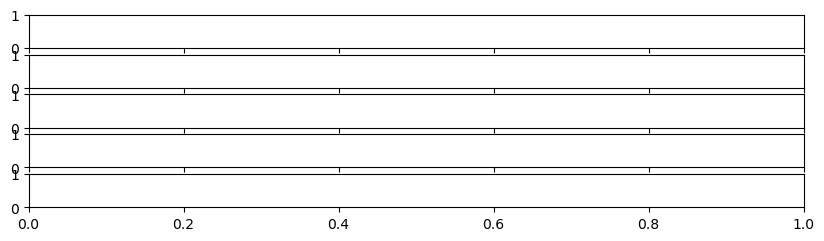

In [1]:
import warnings
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.patches as patches
import scanpy as sc

# Ignore warnings
warnings.simplefilter("ignore", category=FutureWarning)
warnings.simplefilter("ignore", category=UserWarning)

# Define colormaps for different gene sets
COLORMAPS = {   
    "F1": mcolors.LinearSegmentedColormap.from_list("bright_yellow", ["#FFFFFF", "#FFD700"], N=256),
    "F3": "Reds",
    "F6": mcolors.LinearSegmentedColormap.from_list("neon_blue", ["#FFFFFF", "#00FFFF"], N=256),
    "F7": "Blues",
    "F8": mcolors.LinearSegmentedColormap.from_list("neon_pink", ["#FFFFFF", "#F58FBE"], N=256)
}

CONTROL_SIZE = 1000
N_BINS = 25
FIGSIZE = (10, 0.5)

# Gene sets
GENE_SETS = ["F1", "F3", "F6", "F7", "F8"]

# Create subplots for all plots, sharing x-axis
fig, axes = plt.subplots(nrows=len(GENE_SETS), figsize=(10, len(GENE_SETS) * 0.5), sharex=True)

def plot_matrix(cluster_scores, cmap, normalisation, ax, show_xticks=False):
    """Plots a single heatmap onto an existing axis `ax`, with explicit marking of missing conditions."""

    # Ensure all ORDER categories exist
    for condition in ORDER:
        if condition not in cluster_scores.index:
            cluster_scores.loc[condition] = np.nan  # Insert NaN row

    # Reorder rows
    cluster_scores = cluster_scores.loc[ORDER]

    # Normalization
    if normalisation == "minmax":
        cluster_scores = (cluster_scores - cluster_scores.min()) / (cluster_scores.max() - cluster_scores.min())

    # Mask for missing values (NaNs will be greyed out)
    mask = cluster_scores.isna()

    # Convert cmap to LinearSegmentedColormap if it's a string
    if isinstance(cmap, str):
        cmap = plt.cm.get_cmap(cmap)

    # Define a custom colormap that includes grey for missing values
    cmap_with_grey = cmap
    cmap_with_grey.set_bad(color='#D3D3D3')  # Light gray for NaNs

    # Plot heatmap with mask (Transposed for vertical bars)
    sns.heatmap(cluster_scores.T, cmap=cmap_with_grey, linewidths=0.5, linecolor='white', 
                cbar_kws={"label": "", "shrink": 0.9, "aspect": 10}, vmin=0, ax=ax, 
                square=False, xticklabels=False, yticklabels=False, mask=mask.T)
    ax.grid(False)
    cbar = ax.collections[0].colorbar
    cbar.set_ticks([0, 0.5, 1])
    cbar.set_ticklabels([0, 0.5, 1])
    cbar = ax.collections[0].colorbar
    cbar.ax.tick_params(labelsize=8)  # Adjust the font size (e.g., 8)

    # Add a black border
    ax.add_patch(patches.Rectangle(
        (0, 0), len(cluster_scores.index), len(cluster_scores.columns),
        linewidth=2, edgecolor='black', facecolor='none'))

    # X-Ticks (only show for last plot)
    if show_xticks:
        ax.set_xticks([i + 0.5 for i in range(len(cluster_scores.index))])
        ax.set_xticklabels(cluster_scores.index, rotation=90, fontsize=12, ha='center')
    else:
        ax.set_xticks([])  # Remove xticks for all but last subplot

    # Y-Ticks (only for clarity)
    ax.set_yticks([i + 0.5 for i in range(len(cluster_scores.columns))])
    ax.set_yticklabels(cluster_scores.columns, fontsize=12, va='center')
    ax.set_xlabel("")
    ax.set_title("", fontsize=0)

# Loop through each gene set
for i, (gene_set, cmap) in enumerate(COLORMAPS.items()):
    adata_ii = adata_lesional[adata_lesional.obs["test13"].str.startswith(gene_set)]

    # Get the value counts of the "test13" column
    value_counts = adata_ii.obs["Patient_status2"].value_counts()

    # Get the values that occur more than 100 times
    valid_values = value_counts[value_counts > 15].index
    # Filter adata_ii to keep only those rows where "test13" is in the valid_values
    adata_ii = adata_ii[adata_ii.obs["Patient_status2"].isin(valid_values)].copy()
    adata_ii = sc.tl.score_genes(adata_ii, GENES[gene_set], ctrl_size=CONTROL_SIZE, n_bins=N_BINS, copy=True, score_name=f"{gene_set}\nsignature")
    
    # Compute mean scores per patient status
    cluster_scores = adata_ii.obs.groupby('Patient_status2')[[f"{gene_set}\nsignature"]].mean()

    # Create a filtered list of diseases based on the fibroblast subtype proportions
    filtered_diseases = []
    for disease in cluster_scores.index:
        # Check if the proportion of the current fibroblast subtype (e.g., F1, F3) is < 5%
        fibroblast_proportion = None
        for prefix in fibroblast_subtype_proportions.columns:
            if prefix.startswith(gene_set):  # Check if the column name starts with the desired prefix (e.g., 'F1')
                fibroblast_proportion = fibroblast_subtype_proportions.loc[disease, prefix]
                break  # Stop after finding the matching column

        # Check if fibroblast_proportion is below 0.05; if yes, exclude this disease from the plot
        if fibroblast_proportion is not None and fibroblast_proportion < 0.005:
            continue  # Skip this disease if the proportion is below 0.05

        # If fibroblast_proportion is None or above 0.05, include this disease
        filtered_diseases.append(disease)

    # Now filter the data before plotting
    # We filter the cluster_scores to only include the diseases that pass the filtering condition
    filtered_cluster_scores = cluster_scores.loc[filtered_diseases]

    # Now plot with the filtered data
    plot_matrix(filtered_cluster_scores, cmap, "minmax", axes[i], show_xticks=(i == len(GENE_SETS) - 1))

# Add common x-axis label
fig.supxlabel("", fontsize=14)

plt.tight_layout()

plt.show()

SyntaxError: invalid syntax. Perhaps you forgot a comma? (3374206999.py, line 1)

In [61]:
adata_lesional.obs.test13.value_counts()

test13
F8: Fascia-like myofibroblast     38290
F1: Superficial                   36949
F7: Myofibroblast                 25474
F3: FRC-like                      23147
F2: Universal                     17949
F2/3: Perivascular                14900
F4: DS_DPEP1+                     11182
F6: Inflammatory myofibroblast     6157
F5: NGFR+                          5987
F5: RAMP1+                         4554
F4: TNN+COCH+                      3466
F_Fascia                           1764
F4: DP_HHIP+                        937
Name: count, dtype: int64

In [41]:
STOP

NameError: name 'STOP' is not defined

# vertical barts 

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import matplotlib.colors as mcolors
import numpy as np

# Define colormaps for different gene sets
COLORMAPS = {   

    "F7": "Blues",
      "F6": mcolors.LinearSegmentedColormap.from_list("neon_blue", ["#FFFFFF", "#00FFFF"], N=256),  # Neon Blue
       "F3": "Reds",
        "F1": mcolors.LinearSegmentedColormap.from_list(
        "bright_yellow", ["#FFFFFF", "#FFD700"], N=256),  # White → Neon Yellow → Gold
 
  
}

CONTROL_SIZE = 1000
N_BINS = 25
FIGSIZE = (10, 0.5)

# Gene sets
GENE_SETS = ["F1", "F3", "F6", "F7"]
#GENE_SETS=GENE_SETS[::-1]
# Create subplots for all plots, sharing x-axis
fig, axes = plt.subplots(nrows=len(GENE_SETS), figsize=(10, len(GENE_SETS) * 0.5), sharex=True)

def plot_matrix(cluster_scores, cmap, normalisation, ax, show_xticks=False):
    """Plots a single heatmap onto an existing axis `ax`, with explicit marking of missing conditions."""

    # Ensure all ORDER categories exist
    for condition in ORDER:
        if condition not in cluster_scores.index:
            cluster_scores.loc[condition] = np.nan  # Insert NaN row

    # Reorder rows
    cluster_scores = cluster_scores.loc[ORDER]

    # Normalization
    if normalisation == "minmax":
        cluster_scores = (cluster_scores - cluster_scores.min()) / (cluster_scores.max() - cluster_scores.min())

    # Mask for missing values (NaNs will be greyed out)
    mask = cluster_scores.isna()

    # Convert cmap to LinearSegmentedColormap if it's a string
    if isinstance(cmap, str):
        cmap = plt.cm.get_cmap(cmap)

    # Define a custom colormap that includes grey for missing values
    cmap_with_grey = cmap
    cmap_with_grey.set_bad(color='#D3D3D3')  # Light gray for NaNs

    # Plot heatmap with mask
    sns.heatmap(cluster_scores.T, cmap=cmap_with_grey, linewidths=0.5, linecolor='white', 
                cbar_kws={"label": ""}, vmin=0, ax=ax, 
                square=False, xticklabels=False, yticklabels=False, mask=mask.T)  # Apply transposed mask
    
    ax.grid(False)
    cbar = ax.collections[0].colorbar
    cbar.set_ticks([0, 0.5, 1])
    cbar.set_ticklabels([0, 0.5, 1])

    # Adjust the colorbar font size
    cbar.ax.tick_params(labelsize=8)  # Decrease font size of colorbar ticks
    
    # Add a black border
    ax.add_patch(patches.Rectangle(
        (0, 0), len(cluster_scores.index), len(cluster_scores.columns),
        linewidth=2, edgecolor='black', facecolor='none'))

    # X-Ticks (only show for last plot)
    if show_xticks:
        ax.set_xticks([i + 0.5 for i in range(len(cluster_scores.index))])
        ax.set_xticklabels(cluster_scores.index, rotation=90, fontsize=12, ha='center')
    else:
        ax.set_xticks([])  # Remove xticks for all but last subplot

    # Y-Ticks (only for clarity)
    ax.set_yticks([i + 0.5 for i in range(len(cluster_scores.columns))])
    ax.set_yticklabels(cluster_scores.columns, fontsize=12, va='center', rotation=90)

    ax.set_title("", fontsize=0)

# Loop through each gene set
for i, (gene_set, cmap) in enumerate(COLORMAPS.items()):
    adata_ii = adata_lesional[adata_lesional.obs["test13"].str.startswith(gene_set)]
    
    # Get the value counts of the "test13" column
    value_counts = adata_ii.obs["Patient_status2"].value_counts()

    # Get the values that occur more than 100 times
    valid_values = value_counts[value_counts > 15].index
    # Filter adata_ii to keep only those rows where "test13" is in the valid_values
    adata_ii = adata_ii[adata_ii.obs["Patient_status2"].isin(valid_values)].copy()
    adata_ii = sc.tl.score_genes(adata_ii, GENES[gene_set], ctrl_size=CONTROL_SIZE, n_bins=N_BINS, copy=True, score_name=f"{gene_set}")
    
    # Compute mean scores per patient status
    cluster_scores = adata_ii.obs.groupby('Patient_status2')[[f"{gene_set}"]].mean()
    
    # Plot matrix in the current axis
    plot_matrix(cluster_scores, cmap, "minmax", axes[i], show_xticks=(i == len(GENE_SETS) - 1))

# Add common x-axis label
fig.supxlabel("", fontsize=14)

plt.tight_layout()
plt.show()

In [ ]:
stop

# PLOT ALL GENES FOR SUPPLEMENTARY

In [ ]:
ALL_GENES = {"F1": GENES["F1"],
"F3": GENES["F3"],
"F6": GENES["F6"],
"F7": GENES["F7"]}

for POPULATION in ALL_GENES.keys():
    adata_ii =adata_i[adata_i.obs["test13"].str.startswith(POPULATION)]
    ORDER_TEMP = [x for x in ORDER if x in adata_ii.obs["Patient_status2"].unique()]
    sc.pl.dotplot(
        adata_ii,
        ALL_GENES[POPULATION], cmap="Reds",
        groupby="Patient_status2",vmax=1,colorbar_title='Mean expression\n(variance scaled)',
        standard_scale="var", 
        dendrogram=False,
        title=POPULATION,
        categories_order=ORDER_TEMP
       # save="fig4_neurofibroma.pdf"
    )   

In [ ]:
import matplotlib.pyplot as plt
import scanpy as sc

ALL_GENES = {
    "F1": GENES["F1"],
    "F3": GENES["F3"],
    "F6": GENES["F6"],
    "F7": GENES["F7"]
}

# Set up the subplot grid with one row and as many columns as there are gene sets
fig, axes = plt.subplots(1, len(ALL_GENES), figsize=(len(ALL_GENES) * 6, 6))  #

# Loop through each gene set and plot the dotplots in the subplots
for i, POPULATION in enumerate(ALL_GENES.keys()):
    adata_ii = adata_i[adata_i.obs["test13"].str.startswith(POPULATION)]
    ORDER_TEMP = [x for x in ORDER if x in adata_ii.obs["Patient_status2"].unique()]

    # Create the dotplot on the i-th axis
    sc.pl.dotplot(
        adata_ii,
        ALL_GENES[POPULATION], cmap="Reds",
        groupby="Patient_status2", vmax=1, colorbar_title='Mean expression\n(variance scaled)',
        standard_scale="var", 
        dendrogram=False,
        title=POPULATION,
        categories_order=ORDER_TEMP,
        ax=axes[i],  # Place the plot in the correct subplot
        show=False  # To prevent the plot from displaying immediately
    )

# Adjust layout and show the plot
plt.savefig("all_disease_gene_expression.pdf", dpi=300, bbox_inches="tight") 

plt.tight_layout()
            
plt.show()

In [ ]:
import numpy as np
import scanpy as sc

ALL_GENES = {
    "F1": GENES["F1"],
    "F3": GENES["F3"],
    "F6": GENES["F6"],
    "F7": GENES["F7"]
}

for POPULATION in ALL_GENES.keys():
    adata_ii = adata_i[adata_i.obs["test13"].str.startswith(POPULATION)]
    
    # Find categories in ORDER that are not in Patient_status2
    missing_categories = [category for category in ORDER if category not in adata_ii.obs["Patient_status2"].unique()]
    
    # Create ORDER_TEMP by including only present categories
    ORDER_TEMP = [category for category in ORDER if category in adata_ii.obs["Patient_status2"].unique()]
    
    # Create a copy of adata_ii for categories that are not present, and keep it empty
    for missing_category in missing_categories:
        # Manually assign zero values (or NaNs) to rows that are missing for plotting
        adata_empty = adata_ii[adata_ii.obs["Patient_status2"] == missing_category].copy()
        adata_empty.obs["Patient_status2"] = missing_category  # Make sure the category is correctly represented
        # Use concatenate to add the empty rows to the original adata
        adata_ii = adata_ii.concatenate(adata_empty, batch_key="Patient_status2")
    
    # Now, recheck that ORDER_TEMP is updated to include missing categories in the correct order
    ORDER_TEMP += missing_categories  # Adding missing categories at the end (empty)

    # Plot the dotplot
    sc.pl.dotplot(
        adata_ii,
        ALL_GENES[POPULATION], cmap="Reds",
        groupby="Patient_status2", vmax=1, colorbar_title='Mean expression\n(variance scaled)',
        standard_scale="var", 
        dendrogram=False,
        title=POPULATION,
        categories_order=ORDER_TEMP
    )

In [ ]:
# import pandas as pd
# import seaborn as sns
# import matplotlib.pyplot as plt
# import matplotlib.patches as patches
# import matplotlib.colors as mcolors
# import numpy as npaaa

# # Define ORDER for row alignment
# ORDER = [
#     'Squamous cell carcinoma', 'Basal cell carcinoma', 'Cutaneous melanoma',
#     'Acral melanoma', 'Acne', 'Hidradenitis suppurativa', 'Sarcoidosis',
#     'Granuloma annulare', 'Lupus (DLE)', 'Psoriasis', 'Prurigo nodularis',
#     'Eczema', 'Alopecia areata', 'Lupus (SCLE)', 'Drug reaction: lichenoid',
#     'Drug reaction: DRESS', 'Erythema migrans', 'Keloid scar', "Dupuytren contracture",
#     'Non-keloid scar', 'Systemic sclerosis', 'Morphoea (pansclerotic)'
# ]

# # Define colormaps for different gene sets
# COLORMAPS = {   
#     "F1": mcolors.LinearSegmentedColormap.from_list("bright_yellow", ["#FFFFFF", "#FFD700"], N=256),
#     "F3": "Reds",
#     "F6": mcolors.LinearSegmentedColormap.from_list("neon_blue", ["#FFFFFF", "#00FFFF"], N=256),
#     "F7": "Blues",
# }

# CONTROL_SIZE = 1000
# N_BINS = 25
# FIGSIZE = (10, 3)  # Adjust height for a clean view

# # Gene sets
# GENE_SETS = ["F1", "F3", "F6", "F7"]

# # Create subplots for all plots, sharing x-axis
# fig, axes = plt.subplots(nrows=1, ncols=len(GENE_SETS), figsize=(10, 3), sharey=True)

# def plot_matrix(cluster_scores, cmap, normalisation, ax, show_xticks=False):
#     """Plots horizontal bars onto an existing axis `ax`, with explicit marking of missing conditions."""
    
#     # Ensure all ORDER categories exist
#     for condition in ORDER:
#         if condition not in cluster_scores.index:
#             cluster_scores.loc[condition] = np.nan  # Insert NaN row

#     # Reorder rows (conditions)
#     cluster_scores = cluster_scores.loc[ORDER]

#     # Normalization
#     if normalisation == "minmax":
#         cluster_scores = (cluster_scores - cluster_scores.min()) / (cluster_scores.max() - cluster_scores.min())

#     # Plot horizontal bars (One bar per `GENE_SET`)
#     bars = ax.barh(cluster_scores.index, cluster_scores.values.flatten(), 
#                    color=cmap(cluster_scores.values.flatten()), edgecolor='black')

#     ax.set_xlim(0, 1)  # Set x-limits for the bars to be in the 0-1 range
#     ax.set_xticks([0, 0.5, 1])  # X-axis ticks from 0 to 1
#     ax.set_xticklabels([0, 0.5, 1], fontsize=12)
    
#     # Set the title for each subplot
#     ax.set_title(f"{list(cmap.keys())[0]}", fontsize=14)  # Use first cmap name as title
    
#     # Remove ylabel for Patient_status2 (diseases), but still keep yticks
#     ax.set_ylabel('')
#     ax.grid(False)

# # Loop through each gene set and plot them
# for i, (gene_set, cmap) in enumerate(COLORMAPS.items()):
#     adata_ii = adata_lesional[adata_lesional.obs["test13"].str.startswith(gene_set)]
    
#     # Get the value counts of the "test13" column
#     value_counts = adata_ii.obs["Patient_status2"].value_counts()

#     # Get the values that occur more than 100 times
#     valid_values = value_counts[value_counts > 15].index
#     # Filter adata_ii to keep only those rows where "test13" is in the valid_values
#     adata_ii = adata_ii[adata_ii.obs["Patient_status2"].isin(valid_values)].copy()
#     adata_ii = sc.tl.score_genes(adata_ii, GENES[gene_set], ctrl_size=CONTROL_SIZE, n_bins=N_BINS, copy=True, score_name=f"{gene_set}\nsignature")
    
#     # Compute mean scores per patient status
#     cluster_scores = adata_ii.obs.groupby('Patient_status2')[[f"{gene_set}\nsignature"]].mean()
    
#     # Plot bars for each gene set
#     plot_matrix(cluster_scores, cmap, "minmax", axes[i])

# # Add common x-axis label
# fig.supxlabel("Score", fontsize=14)

# # Remove individual y-ticks
# plt.tight_layout()

# # Move the colorbar to below each plot (if you want a colorbar for each)
# for ax in axes:
#     cbar = ax.collections[0].colorbar
#     cbar.ax.set_position([0.5, -0.15, 0.1, 0.02])  # Position it below the plot

# plt.show()

In [ ]:
import pickle

# Define ORDER for row alignment
ORDER = [
    'Squamous cell carcinoma',
    'Basal cell carcinoma', 'Cutaneous melanoma',
    'Acral melanoma',
    'Acne',
    'Hidradenitis suppurativa', 'Sarcoidosis',
    'Granuloma annulare',
    'Lupus (DLE)',
    'Psoriasis',
    'Prurigo nodularis',
    'Eczema', 'Alopecia areata', 'Lupus (SCLE)',
    'Drug reaction: lichenoid',
    'Drug reaction: DRESS',
    'Erythema migrans',
    'Keloid scar', "Dupuytren contracture", 'Non-keloid scar', 'Systemic sclerosis', 'Morphoea (pansclerotic)',
]

# Define colormaps for different gene sets
COLORMAPS = {   
    "F1": mcolors.LinearSegmentedColormap.from_list(
        "bright_yellow", ["#FFFFFF", "#FFD700"], N=256 ), # White → Neon Yellow → Gold
    "F3": "Reds",
    "F6": mcolors.LinearSegmentedColormap.from_list("neon_blue", ["#FFFFFF", "#00FFFF"], N=256),  # Neon Blue
    "F7": "Blues",
}

CONTROL_SIZE = 1000
N_BINS = 25
FIGSIZE = (10, 0.5)

# Gene sets
GENE_SETS = ["F1", "F3", "F6", "F7"]

# Create subplots for all plots, sharing x-axis
fig, axes = plt.subplots(nrows=len(GENE_SETS), figsize=(10, len(GENE_SETS) * 0.5), sharex=True)

# Store precomputed gene scores in a dictionary
precomputed_scores = {}

# Precompute scores for each gene set and save them to a file (optional)
for gene_set in GENE_SETS:
    adata_ii = adata_lesional[adata_lesional.obs["test13"].str.startswith(gene_set)]
    
    # Get the value counts of the "test13" column
    value_counts = adata_ii.obs["Patient_status2"].value_counts()

    # Get the values that occur more than 20 times
    valid_values = value_counts[value_counts > 20].index
    # Filter adata_ii to keep only those rows where "test13" is in the valid_values
    adata_ii = adata_ii[adata_ii.obs["Patient_status2"].isin(valid_values)].copy()

    # Compute score for each gene set and store it
    adata_ii = sc.tl.score_genes(adata_ii, GENES[gene_set], ctrl_size=CONTROL_SIZE, n_bins=N_BINS, copy=True, score_name=f"{gene_set}\nsignature")
    
    # Store the computed scores in the precomputed_scores dictionary
    cluster_scores = adata_ii.obs.groupby('Patient_status2')[[f"{gene_set}\nsignature"]].mean()
    precomputed_scores[gene_set] = cluster_scores

    # Optionally, save the precomputed scores to a pickle file (to avoid recomputing in future)
    with open(f"precomputed_scores_{gene_set}.pkl", "wb") as f:
        pickle.dump(cluster_scores, f)

In [ ]:
cluster_scores

In [ ]:
def plot_matrix(cluster_scores, cmap, normalisation, ax, show_xticks=False):
    """Plots a single heatmap onto an existing axis `ax`, with explicit marking of missing conditions."""

    # Debugging: Check the shape of cluster_scores
    print(f"Cluster scores shape: {cluster_scores.shape}")

    # Ensure all ORDER categories exist
    for condition in ORDER:
        if condition not in cluster_scores.index:
            cluster_scores.loc[condition] = np.nan  # Insert NaN row

    # Reorder rows based on ORDER
    cluster_scores = cluster_scores.loc[ORDER]

    # Debugging: Check the reordered cluster_scores
    print(f"Reordered cluster scores (head):\n{cluster_scores.head()}")

    # Normalization
    if normalisation == "minmax":
        cluster_scores = (cluster_scores - cluster_scores.min()) / (cluster_scores.max() - cluster_scores.min())

    # Mask for missing values (NaNs will be greyed out)
    mask = cluster_scores.isna()

    # Convert cmap to LinearSegmentedColormap if it's a string
    if isinstance(cmap, str):
        cmap = plt.cm.get_cmap(cmap)

    # Define a custom colormap that includes grey for missing values
    cmap_with_grey = cmap
    cmap_with_grey.set_bad(color='#D3D3D3')  # Light gray for NaNs

    # Plot heatmap with mask
    sns.heatmap(cluster_scores.T, cmap=cmap_with_grey, linewidths=0.5, linecolor='white', 
                cbar_kws={"label": ""}, vmin=0, ax=ax, 
                square=False, xticklabels=False, yticklabels=False, mask=mask.T)  # Apply transposed mask
    
    ax.grid(False)
    cbar = ax.collections[0].colorbar
    cbar.set_ticks([0, 0.5, 1])
    cbar.set_ticklabels([0, 0.5, 1])

    # Add a black border
    ax.add_patch(patches.Rectangle(
        (0, 0), len(cluster_scores.index), len(cluster_scores.columns),
        linewidth=2, edgecolor='black', facecolor='none'))

    # X-Ticks (only show for last plot)
    if show_xticks:
        ax.set_xticks([i + 0.5 for i in range(len(cluster_scores.index))])
        ax.set_xticklabels(cluster_scores.index, rotation=90, fontsize=12, ha='center')
    else:
        ax.set_xticks([])  # Remove xticks for all but last subplot

    # Y-Ticks (only for clarity)
    ax.set_yticks([i + 0.5 for i in range(len(cluster_scores.columns))])
    ax.set_yticklabels(cluster_scores.columns, fontsize=12, va='center')

    ax.set_title("", fontsize=0)

In [ ]:

# Loop through each gene set
for i, (gene_set, cmap) in enumerate(COLORMAPS.items()):
    adata_ii = adata_lesional[adata_lesional.obs["test13"].str.startswith(gene_set)]
    
    # Get the value counts of the "test13" column
    value_counts = adata_ii.obs["Patient_status2"].value_counts()

    # Get the values that occur more than 100 times
    valid_values = value_counts[value_counts > 20].index
    # Filter adata_ii to keep only those rows where "test13" is in the valid_values
    adata_ii = adata_ii[adata_ii.obs["Patient_status2"].isin(valid_values)].copy()
    adata_ii = sc.tl.score_genes(adata_ii, GENES[gene_set], ctrl_size=CONTROL_SIZE, n_bins=N_BINS, copy=True, score_name=f"{gene_set}\nsignature")
    
    # Compute mean scores per patient status
    cluster_scores = adata_ii.obs.groupby('Patient_status2')[[f"{gene_set}\nsignature"]].mean()
    
    # Plot matrix in the current axis
    plot_matrix(cluster_scores, cmap, "minmax", axes[i], show_xticks=(i == len(GENE_SETS) - 1))

# Add common x-axis label
fig.supxlabel("Patient status", fontsize=14)

plt.tight_layout()
plt.show()

In [ ]:
os.listdir()

In [ ]:
# Loop through each gene set
for i, (gene_set, cmap) in enumerate(COLORMAPS.items()):
    adata_ii = adata_lesional[adata_lesional.obs["test13"].str.startswith(gene_set)]
    
    # Get the value counts of the "test13" column
    value_counts = adata_ii.obs["Patient_status2"].value_counts()

    # Get the values that occur more than 100 times
    valid_values = value_counts[value_counts > 15].index
    # Filter adata_ii to keep only those rows where "test13" is in the valid_values
    adata_ii = adata_ii[adata_ii.obs["Patient_status2"].isin(valid_values)].copy()
    adata_ii = sc.tl.score_genes(adata_ii, GENES[gene_set], ctrl_size=CONTROL_SIZE, n_bins=N_BINS, copy=True, score_name=f"{gene_set}\nsignature")
    
    # Compute mean scores per patient status
    cluster_scores = adata_ii.obs.groupby('Patient_status2')[[f"{gene_set}\nsignature"]].mean()
    
    # Plot matrix in the current axis
    plot_matrix(cluster_scores, cmap, "minmax", axes[i], show_xticks=(i == len(GENE_SETS) - 1))

    # Rotate colorbar to be vertical (90 degrees)
    cbar = axes[i].collections[0].colorbar
    cbar.ax.yaxis.set_ticks_position('right')  # Move ticks to the right side
    cbar.ax.set_ylabel('Intensity', rotation=90, fontsize=12)  # Rotate the label of the colorbar if needed
    cbar.ax.yaxis.set_label_position('right')  # Position the label to the right
    cbar.ax.tick_params(axis='y', labelrotation=90)  # Rotate the ticks

# Add common x-axis label
fig.supxlabel("Patient status", fontsize=14)

plt.tight_layout()
plt.show()

In [ ]:
adata_i[adata_i.obs["Patient_status2"]=="Cutaneous melanoma"].obs.test13.value_counts()

In [ ]:
adata_i =

# All gene modules

In [ ]:
# import pickle

# # Define your file path
# file_path = '/nfs/team298/ls34/fb_dict_lesional.pkl'

# # Save the dictionary
# with open(file_path, 'wb') as file:
#     pickle.dump(LESIONAL_GENES_VSHORT5, file)


In [ ]:
import os
os.listdir()

In [ ]:
df2=pd.read_csv("degs_fbs.csv")
df2.columns

In [ ]:
CONTROL_SIZE = 200 #default 50 (100 was good)
N_BINS=25 #default 25 (10 was good)
N = 50

In [ ]:
import gc

In [ ]:
adata_i = sc.tl.score_genes(adata_i, df2['F1: Superficial'][:N], ctrl_size=CONTROL_SIZE, n_bins=N_BINS, copy=True, score_name="F1")
gc.collect()

In [ ]:
adata_i = sc.tl.score_genes(adata_i, df2['F2: Universal'][:N], ctrl_size=CONTROL_SIZE, n_bins=N_BINS, copy=True, score_name="F2")
gc.collect()

In [ ]:
adata_i = sc.tl.score_genes(adata_i, df2['F2/3: Stroma_PPARG+'][:N], ctrl_size=CONTROL_SIZE, n_bins=N_BINS, copy=True, score_name="F2/3")
gc.collect()

In [ ]:
adata_i = sc.tl.score_genes(adata_i, df2['F3: FRC-like'][:N], ctrl_size=CONTROL_SIZE, n_bins=N_BINS, copy=True, score_name="F3")
gc.collect()


In [ ]:
adata_i = sc.tl.score_genes(adata_i, df2['F4: DS_DPEP1+'][:N], ctrl_size=CONTROL_SIZE, n_bins=N_BINS, copy=True, score_name="F4: DS")
gc.collect()

In [ ]:
adata_i = sc.tl.score_genes(adata_i, df2['F4: DP_HHIP+'][:N], ctrl_size=CONTROL_SIZE, n_bins=N_BINS, copy=True, score_name="F4: DP")
gc.collect()


In [ ]:
adata_i = sc.tl.score_genes(adata_i, df2['F4: TNN+COCH+'][:N], ctrl_size=CONTROL_SIZE, n_bins=N_BINS, copy=True, score_name="F4: TNN+COCH+")
gc.collect()


In [ ]:
adata_i = sc.tl.score_genes(adata_i, df2['F5: RAMP1+'][:N], ctrl_size=CONTROL_SIZE, n_bins=N_BINS, copy=True, score_name="F5: RAMP1+")
gc.collect()

In [ ]:
adata_i = sc.tl.score_genes(adata_i, df2['F5: NGFR+'][:N], ctrl_size=CONTROL_SIZE, n_bins=N_BINS, copy=True, score_name="F5: NGFR+")
gc.collect()


In [ ]:
adata_i = sc.tl.score_genes(adata_i, df2["F6: Inflammatory myofibroblast"][:N], ctrl_size=CONTROL_SIZE, n_bins=N_BINS, copy=True, score_name="F6")
gc.collect()

In [ ]:
adata_i = sc.tl.score_genes(adata_i, df2["F6: Myofibroblast"][:N], ctrl_size=CONTROL_SIZE, n_bins=N_BINS, copy=True, score_name="F7")
gc.collect()

In [ ]:
adata_i = sc.tl.score_genes(adata_i, df2['F7: Fascia-like myofibroblast'][:N], ctrl_size=CONTROL_SIZE, n_bins=N_BINS, copy=True, score_name="F8")
gc.collect()

In [ ]:
cluster_scores

In [ ]:
cluster_scores = adata_i.obs.groupby('Patient_status2')[['F1', "F2", "F2/3", "F3", "F4: DS",
                                                 "F4: TNN+COCH+", "F4: DP", "F5: RAMP1+",
                                                 "F5: NGFR+", "F6", "F7", "F8"]].mean()
cluster_scores

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.patches as patches

# # ORDER list for row reordering
ORDER = [
    'Squamous cell carcinoma',
    'Basal cell carcinoma', 'Cutaneous melanoma',
    'Acral melanoma',
    'Acne',
    'Hidradenitis suppurativa', 'Sarcoidosis',
    'Granuloma annulare', 'Sarcoidosis',
    'Lupus (DLE)',
    'Psoriasis',
    'Prurigo nodularis',
    'Eczema', 'Alopecia areata', 'Lupus (SCLE)',
    'Drug reaction: lichenoid',
    'Drug reaction: DRESS',
    'Erythema migrans',
    'Keloid scar', "Dupuytren contracture", 'Non-keloid scar', 'Systemic sclerosis', 'Morphoea (pansclerotic)',
]

def plot_matrix(cluster_scores, cmap="viridis", normalisation=None, colorbar_ticks=[0, 0.5, 1], dataset_name="Prenatal Fibroblasts",
               reorder_dict=None, reorder_list=ORDER, FIGSIZE=(10, 0.5)):
    max_score = cluster_scores.max().max()
    
    # Reorder based on ORDER list if available
    if reorder_list:
        cluster_scores = cluster_scores.loc[reorder_list]

    if reorder_dict:
        # Rename columns if reorder_dict is provided
        cluster_scores.rename(columns=reorder_dict, inplace=True)
    
    # Change "Stroma_MCP" to "F6: Inflammatory myofibroblast signature" in column names
    cluster_scores.rename(columns=lambda x: x.replace("Stroma_MCP", "F6: Inflammatory myofibroblast\nsignature"), inplace=True)

    # Apply normalization if specified
    if not normalisation:
        cluster_scores_normalized = cluster_scores
    else:
        if normalisation == "max":
            cluster_scores_normalized = cluster_scores / max_score
        elif normalisation == "minmax":
            cluster_scores_normalized = (cluster_scores - cluster_scores.min()) / (cluster_scores.max() - cluster_scores.min())
        elif normalisation == "row":
            cluster_scores_normalized = cluster_scores.div(cluster_scores.max(axis=0), axis=1)
        elif normalisation == "col":
            cluster_scores_normalized = cluster_scores.div(cluster_scores.max(axis=1), axis=0)
        else:
            print("Not valid normalisation method. Choose from ['max', 'minmax', 'row', 'col']")
    
    fig, ax = plt.subplots(figsize=FIGSIZE)
    
    # Plot the heatmap (transpose to put Patient_status2 on x-axis)
    sns.heatmap(cluster_scores_normalized.T,  # Transpose to place Patient_status2 on the x-axis
                cmap=cmap,
                linewidths=0.5,  # Add a tiny bit of space between boxes (adjust linewidths)
                linecolor='white',  # White color for the spaces
                cbar_kws={"label": "Gene module\nscore"},
                vmin=0,
                ax=ax,
                square=False,  # No need for a square plot
                xticklabels=False,  # Hide x-tick labels
                yticklabels=False)  # Hide y-tick labels
    
    # Remove gridlines completely
    ax.grid(False)

    # Adjust the colorbar ticks
    cbar = ax.collections[0].colorbar
    cbar.set_ticks(colorbar_ticks)
    cbar.set_ticklabels(colorbar_ticks)
    
    # Set x-ticks and labels based on cluster_scores.index (which is now Patient_status2)
    ax.set_xticks([i + 0.5 for i in range(len(cluster_scores_normalized.index))])  # Adjust x-ticks based on custom order
    ax.set_xticklabels(cluster_scores_normalized.index, rotation=90, fontsize=12, ha='center')  # Set custom order for x-axis

    # Set y-ticks and labels based on reorder_list (which corresponds to the rows)
    ax.set_yticks([i + 0.5 for i in range(len(cluster_scores_normalized.columns))])  # Adjust y-ticks based on custom order
    ax.set_yticklabels(cluster_scores_normalized.columns, fontsize=12, va='center')  # Set custom order for y-axis labels
    
    # Add a black border around the entire heatmap (outer grid)
    ax.add_patch(patches.Rectangle(
        (0, 0),  # Position: bottom-left corner
        len(cluster_scores_normalized.index),  # Width of the rectangle
        len(cluster_scores_normalized.columns),  # Height of the rectangle
        linewidth=2,  # Line width of the rectangle
        edgecolor='black',  # Color of the border
        facecolor='none',  # No fill color
    ))

    plt.title(normalisation, fontsize=14)  
    plt.xlabel(dataset_name, fontsize=14)  
    plt.ylabel("", fontsize=14)  

    plt.tight_layout()  
    #plt.savefig("figures/gene_modules_reordered_with_outer_grid.pdf", dpi=300, bbox_inches="tight")  
    plt.show()

# Example call to the function
plot_matrix(cluster_scores, cmap="Reds", normalisation="minmax", colorbar_ticks=[0, 0.5, 1], FIGSIZE=(10, 5), dataset_name="")

In [ ]:
plot_matrix(cluster_scores, cmap="Reds", #normalisation="minmax", 
            colorbar_ticks=[0, 0.5, 1], FIGSIZE=(10, 10), dataset_name="")

# using marker genes

In [ ]:
import pickle

# Define file path
file_path = '/nfs/team298/ls34/fb_dict_lesional_FORWOUND_PLUSDP.pkl'

# Load the object
with open(file_path, 'rb') as file:
    ALL_GENES_NOF8_PLUSDP = pickle.load(file)

ALL_GENES_NOF8_PLUSDP

In [ ]:
GENES = {'F1': ['APCDD1',
  'COL18A1',
  'COL23A1',
  'COL13A1',
  'NKD2',
  'RSPO1',
  'AXIN2',
  'WIF1',
  'CRABP1',
  'TNFRSF21'],
 'F2': ['CD34',
  'PI16',
  'DPP4',
  'MFAP5',
  'PCOLCE2',
  'SLPI',
  'CD70',
  'LGR5'],
 'F2/3': ['CXCL12',
  'APOE',
  'APOC1',
  'C7',
  'PLA2G2A',
  'PPARG',
  'MYOC',
  'GDF10'],
 'F3': ['CCL19',
  'CD74',
  'CH25H',
  'TNFSF13B',
  'IL33',
  'IRF8',
  'IL15',
  'HLA-DRA',
  'ADAMDEC1',
  'CXCL9'],
 'F4: DS': ['DPEP1', 'MYL4'],
 'F4: TNN+COCH+': ['TNN', 'COCH', 'RSPO4', 'MKX'],
 'F4: DP': ['CORIN', 'BMP7', 'LEF1', 'HHIP', 'RSPO3', 'PTCH1'],
 
 'F5: RAMP1+': ['SCN7A', 'FMO2', 'RAMP1', 'RELN'],
 'F5: NGFR+': ['SCN7A', 'FMO2', 'EBF2', 'NGFR', 'ITGA6'],
 'F6': ['CXCL8',
 'CXCL5',
 'CXCL13',
 'IL11',
 'IL24',
 'MMP1',
 'MMP3',
 'IL7R',
 'INHBA',
 'CSF3',
 'TDO2',
 'WWC1',
 'CHI3L1',
 'STAT4',
 'CCL5',
 'CCL3',
 'FAM167A'],
#          ['WNT5A', 'COL7A1', 'CXCL8',
#   'CXCL5',
#   'CXCL6',
#   'CXCL13',
#   'IL11',
#   'IL24',
#   'MMP1',
#   'MMP3',
#   'IL7R',
#   'INHBA',
#   'CSF3',
#   'TDO2',
#   'WWC1',
#   'CHI3L1',
#   'CCL5',
#   'CCL11',
#   'HIF1A', 'WNT2', 'COL10A1', 'LAMP5'],
 'F7': ['WNT2', 'COL10A1', 'LAMP5', 'NRG1', 'OGN', 'ACTA2',
  'TAGLN',
  'ASPN',
  'COMP',
  'COL11A1',
  'KIF26B',
  'ZNF469',
  'RUNX2',
  'SULF1',
  'ADAM12',
  'COL8A1',
  'LRRC15',
  'CREB3L1',
  'CTHRC1',
  'CCN4',
  'FABP5',
  'CDH2'],
 'F7+F8': ['C1QTNF3', 'CADM1', 'LRRC17', 'PIEZO2', 'SFRP4', 'KCNMA1']}




In [ ]:
GENES0

In [ ]:
adata_i = sc.tl.score_genes(adata_i, GENES['F1'][:N], ctrl_size=CONTROL_SIZE, n_bins=N_BINS, copy=True, score_name="F1")
gc.collect()

In [ ]:
adata_i = sc.tl.score_genes(adata_i, GENES['F2'][:N], ctrl_size=CONTROL_SIZE, n_bins=N_BINS, copy=True, score_name="F2")
gc.collect()

In [ ]:
adata_i = sc.tl.score_genes(adata_i, GENES['F2/3'][:N], ctrl_size=CONTROL_SIZE, n_bins=N_BINS, copy=True, score_name="F2/3")
gc.collect()

In [ ]:
adata_i = sc.tl.score_genes(adata_i, GENES['F3'][:N], ctrl_size=CONTROL_SIZE, n_bins=N_BINS, copy=True, score_name="F3")
gc.collect()

In [ ]:
adata_i = sc.tl.score_genes(adata_i, GENES['F4: TNN+COCH+'][:N], ctrl_size=CONTROL_SIZE, n_bins=N_BINS, copy=True, score_name="F4: TNN+COCH+")
gc.collect()
adata_i = sc.tl.score_genes(adata_i, GENES['F4: DP'][:N], ctrl_size=CONTROL_SIZE, n_bins=N_BINS, copy=True, score_name="F4: DP")
gc.collect()

In [ ]:
adata_i = sc.tl.score_genes(adata_i, GENES['F4: DS'][:N], ctrl_size=CONTROL_SIZE, n_bins=N_BINS, copy=True, score_name="F4: DS")
gc.collect()

In [ ]:
adata_i = sc.tl.score_genes(adata_i, GENES['F5: NGFR+'][:N], ctrl_size=CONTROL_SIZE, n_bins=N_BINS, copy=True, score_name="F5: NGFR+")
gc.collect()
adata_i = sc.tl.score_genes(adata_i, GENES['F5: RAMP1+'][:N], ctrl_size=CONTROL_SIZE, n_bins=N_BINS, copy=True, score_name="F5: RAMP1+")
gc.collect()

In [ ]:
adata_i = sc.tl.score_genes(adata_i, GENES['F6'][:N], ctrl_size=CONTROL_SIZE, n_bins=N_BINS, copy=True, score_name="F6")
gc.collect()

In [ ]:
adata_i = sc.tl.score_genes(adata_i, GENES['F7'][:N], ctrl_size=CONTROL_SIZE, n_bins=N_BINS, copy=True, score_name="F7")
gc.collect()

In [ ]:
cluster_scores = adata_i.obs.groupby('Patient_status2')[['F1', "F2", "F2/3", "F3", "F4: DS",
                                                 "F4: TNN+COCH+", "F4: DP", "F5: RAMP1+",
                                                 "F5: NGFR+", "F6", "F7"]].mean()
cluster_scores

In [ ]:
adata_i.X[:5,:5].A

In [ ]:
plot_matrix(cluster_scores, cmap="Reds", normalisation="col", 
            colorbar_ticks=[0, 0.5, 1], FIGSIZE=(10, 10), dataset_name="")

In [ ]:
plot_matrix(cluster_scores, cmap="Reds", normalisation="minmax", 
            colorbar_ticks=[0, 0.5, 1], FIGSIZE=(10, 10), dataset_name="")

In [ ]:


# adata_fetal = sc.tl.score_genes(adata_fetal, df2["F7: Fascia-like myofibroblast"][:N], ctrl_size=CONTROL_SIZE, n_bins=N_BINS, copy=True, score_name="F8")
# gc.collect()

In [ ]:

print(f"Dictionary saved to {file_path}")


import pickle

pickle_file_path = '/nfs/team298/ls34/fb_dict.pkl'

with open(pickle_file_path, 'rb') as file:
    reynolds_short_final = pickle.load(file)





In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

def plot_matrix(cluster_scores, cmap="viridis", normalisation=None, colorbar_ticks=[0, 0.5, 1], dataset_name="Prenatal Fibroblasts",
               reorder_dict=None, reorder_list=None, FIGSIZE=(10, 0.5)):
    max_score = cluster_scores.max().max()
    
    if reorder_list:
        # Reorder rows based on the provided list
        cluster_scores = cluster_scores.loc[reorder_list]
    
    if reorder_dict:
        # Rename columns based on the provided dictionary (if any)
        cluster_scores.rename(columns=reorder_dict, inplace=True)
    
    # Apply normalization if specified
    if not normalisation:
        cluster_scores_normalized = cluster_scores
    else:
        if normalisation == "max":
            cluster_scores_normalized = cluster_scores / max_score
        elif normalisation == "minmax":
            cluster_scores_normalized = (cluster_scores - cluster_scores.min()) / (cluster_scores.max() - cluster_scores.min())
        elif normalisation == "row":
            cluster_scores_normalized = cluster_scores.div(cluster_scores.max(axis=0), axis=1)
        elif normalisation == "col":
            cluster_scores_normalized = cluster_scores.div(cluster_scores.max(axis=1), axis=0)
        else:
            print("Not valid normalisation method. Choose from ['max', 'minmax', 'row', 'col']")
    
    fig, ax = plt.subplots(figsize=FIGSIZE)
    
    # Plot the heatmap (transpose the data to make Patient_status2 on the x-axis)
    sns.heatmap(cluster_scores_normalized.T,  # Transpose to place Patient_status2 on the x-axis
                cmap=cmap,
                linewidths=0,  # No gridlines between cells
                cbar_kws={"label": "Gene module\nscore"},
                vmin=0,
                ax=ax,
                square=False,  # No need for a square plot
                xticklabels=False,  # Hide x-tick labels
                yticklabels=False)  # Hide y-tick labels
    
    # Remove gridlines
    ax.grid(False)

    # Adjust the colorbar ticks
    cbar = ax.collections[0].colorbar
    cbar.set_ticks(colorbar_ticks)
    cbar.set_ticklabels(colorbar_ticks)
    
    # Reorder the y-axis (features) according to reorder_list
    ax.set_yticks([i + 0.5 for i in range(len(reorder_list))])  # Adjust y-ticks based on custom order
    ax.set_yticklabels(reorder_list, fontsize=12, va='center')  # Set the custom order for the y-axis labels

    # Adjust x-axis tick labels (those are now Patient_status2 after transpose)
    ax.set_xticks([i + 0.5 for i in range(len(cluster_scores_normalized.columns))])  # Adjust x-ticks based on custom order
    ax.set_xticklabels(cluster_scores_normalized.columns, rotation=90, fontsize=12, ha='center')  # Set custom order for x-axis

    plt.title(normalisation, fontsize=14)  
    plt.xlabel(dataset_name, fontsize=14)  
    plt.ylabel("", fontsize=14)  

    plt.tight_layout()  
    plt.savefig("figures/gene_modules_horizontal.pdf", dpi=300, bbox_inches="tight")  
    plt.show()

# Example call to the function
plot_matrix(cluster_scores, cmap="bwr", normalisation="minmax", colorbar_ticks=[0, 0.5, 1], FIGSIZE=(10, 0.5), dataset_name="")

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Example ORDER list (replace this with your actual list)
ORDER = [
    'Squamous cell carcinoma',
    'Basal cell carcinoma', 'Cutaneous melanoma',
    'Acral melanoma',
    'Acne',
    'Hidradenitis supparativa', 'Sarcoidosis',
    'Granuloma annulare', 'Sarcoidosis',
    'Lupus (DLE)',
    'Psoriasis',
    'Prurigo nodularis',
    'Eczema', 'Alopecia areata', 'Lupus (SCLE)',
    'Drug reaction: lichenoid',
    'Drug reaction: DRESS',
    'Erythema migrans',
    'Keloid scar', "Dupuytren's", 'Non-keloid scar', 'Systemic sclerosis', 'Morphoea (pansclerotic)',
]

def plot_matrix(cluster_scores, cmap="viridis", normalisation=None, colorbar_ticks=[0, 0.5, 1], dataset_name="Prenatal Fibroblasts",
               reorder_dict=None, reorder_list=ORDER, FIGSIZE=(0.5, 10)):
    max_score = cluster_scores.max().max()
    
    # Reordering based on the provided list
    if reorder_list:
        # Ensure the order of rows matches the ORDER list
        cluster_scores = cluster_scores.loc[reorder_list]

    if reorder_dict:
        cluster_scores.rename(index=reorder_dict, inplace=True)  

    if not normalisation:
        cluster_scores_normalized = cluster_scores
    else:
        if normalisation == "max":
            cluster_scores_normalized = cluster_scores / max_score
        elif normalisation == "minmax":
            cluster_scores_normalized = (cluster_scores - cluster_scores.min()) / (cluster_scores.max() - cluster_scores.min())
        elif normalisation == "row":
            cluster_scores_normalized = cluster_scores.div(cluster_scores.max(axis=0), axis=1)
        elif normalisation == "col":
            cluster_scores_normalized = cluster_scores.div(cluster_scores.max(axis=1), axis=0)
        else:
            print("Not valid normalisation method. Choose from ['max', 'minmax', 'row', 'col']")
    
    fig, ax = plt.subplots(figsize=FIGSIZE)

    # Heatmap plotting with small space between each box (no grid lines)
    sns.heatmap(cluster_scores_normalized.T,  # Transpose to keep rows as ORDER
                cmap=cmap,
                linewidths=0.1,  # Small space between boxes
                linecolor='white',  # Make line color white to avoid gray lines
                cbar_kws={"label": "Gene module\nscore"},
                vmin=0,
                ax=ax,
                square=True,
                xticklabels=False,  # Hide x-tick labels
                yticklabels=False)  # Hide y-tick labels
    
    # Remove the gridlines
    ax.grid(False)

    # Set custom order for the rows (y-axis)
    ax.set_yticks([i + 0.5 for i in range(len(ORDER))])  # Adjust y-ticks based on custom order
    ax.set_yticklabels(ORDER, fontsize=12, va='center')  # Set custom order

    plt.title(normalisation, fontsize=14)  
    plt.xlabel(dataset_name, fontsize=14)  
    plt.ylabel("", fontsize=14)  

    plt.tight_layout()  
    plt.savefig("figures/gene_modules_vertical.pdf", dpi=300, bbox_inches="tight")  
    plt.show()

# Call the plotting function with the ORDER list to reorder
plot_matrix(cluster_scores, cmap="Blues", normalisation="minmax", colorbar_ticks=[0, 0.5, 1], FIGSIZE=(10, 0.5), dataset_name="")

In [ ]:
plot_matrix(cluster_scores, cmap="Blues", normalisation="minmax", 
            colorbar_ticks=[0, 0.5, 1], FIGSIZE=(10, 0.5), dataset_name="")

In [ ]:
plot_matrix(cluster_scores, cmap="bwr", #normalisation="minmax", 
            colorbar_ticks=[0, 0.5, 1], FIGSIZE=(10, 0.5), dataset_name="")

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

def plot_matrix(cluster_scores, cmap="viridis", normalisation=None, colorbar_ticks=[0, 0.5, 1], dataset_name="Prenatal Fibroblasts",
               reorder_dict=None, reorder_list=None, FIGSIZE=(0.5, 10)):
    max_score = cluster_scores.max().max()
    
    if reorder_list:
        cluster_scores = cluster_scores.loc[reorder_list]
    if reorder_dict:
        cluster_scores.rename(index=reorder_dict, inplace=True)  

    if not normalisation:
        cluster_scores_normalized = cluster_scores
    else:
        if normalisation == "max":
            cluster_scores_normalized = cluster_scores / max_score
        elif normalisation == "minmax":
            cluster_scores_normalized = (cluster_scores - cluster_scores.min()) / (cluster_scores.max() - cluster_scores.min())
        elif normalisation == "row":
            cluster_scores_normalized = cluster_scores.div(cluster_scores.max(axis=0), axis=1)
        elif normalisation == "col":
            cluster_scores_normalized = cluster_scores.div(cluster_scores.max(axis=1), axis=0)
        else:
            print("Not valid normalisation method. Choose from ['max', 'minmax', 'row', 'col']")
    
    fig, ax = plt.subplots(figsize=FIGSIZE)

    sns.heatmap(cluster_scores_normalized,  # No transpose
                cmap=cmap,
                linewidths=0.01,
                cbar_kws={"label": "Gene module\nscore"},
                vmin=0,
                ax=ax)

    cbar = ax.collections[0].colorbar
    cbar.set_ticks(colorbar_ticks)
    cbar.set_ticklabels(colorbar_ticks)

    ax.set_yticks([i + 0.5 for i in range(len(cluster_scores_normalized.index))])
    ax.set_yticklabels(cluster_scores_normalized.index, rotation=0, fontsize=12, va='center')  

    ax.set_xticks([])  

    plt.title(normalisation, fontsize=14)  
    plt.ylabel(dataset_name, fontsize=14)  
    plt.xlabel("", fontsize=14)  

    plt.tight_layout()  
    plt.savefig("figures/gene_modules_vertical.pdf", dpi=300, bbox_inches="tight")  
    plt.show()

plot_matrix(cluster_scores, cmap="bwr", normalisation="minmax", colorbar_ticks=[0, 0.5, 1], FIGSIZE=(0.5, 10), dataset_name="")

 

In [ ]:
plot_matrix(cluster_scores, cmap="Blues", normalisation="minmax", colorbar_ticks=[0, 0.5, 1], FIGSIZE=(0.5, 10), dataset_name="")

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Example ORDER list (you can replace this with your actual list)
ORDER = [
    'Squamous cell carcinoma',
    'Basal cell carcinoma', 'Cutaneous melanoma',
    'Acral melanoma',
    'Acne',
    'Hidradenitis supparativa', 'Sarcoidosis',
    'Granuloma annulare', 'Sarcoidosis',
    'Lupus (DLE)',
    'Psoriasis',
    'Prurigo nodularis',
    'Eczema', 'Alopecia areata', 'Lupus (SCLE)',
    'Drug reaction: lichenoid',
    'Drug reaction: DRESS',
    'Erythema migrans',
    'Keloid scar', "Dupuytren's", 'Non-keloid scar', 'Systemic sclerosis', 'Morphoea (pansclerotic)',
]

def plot_matrix(cluster_scores, cmap="viridis", normalisation=None, colorbar_ticks=[0, 0.5, 1], dataset_name="Prenatal Fibroblasts",
               reorder_dict=None, reorder_list=ORDER, FIGSIZE=(0.5, 10)):
    max_score = cluster_scores.max().max()
    
    # Reordering based on provided list
    if reorder_list:
        # Ensure the order of rows matches the ORDER list
        cluster_scores = cluster_scores.loc[reorder_list]

    if reorder_dict:
        cluster_scores.rename(index=reorder_dict, inplace=True)  

    if not normalisation:
        cluster_scores_normalized = cluster_scores
    else:
        if normalisation == "max":
            cluster_scores_normalized = cluster_scores / max_score
        elif normalisation == "minmax":
            cluster_scores_normalized = (cluster_scores - cluster_scores.min()) / (cluster_scores.max() - cluster_scores.min())
        elif normalisation == "row":
            cluster_scores_normalized = cluster_scores.div(cluster_scores.max(axis=0), axis=1)
        elif normalisation == "col":
            cluster_scores_normalized = cluster_scores.div(cluster_scores.max(axis=1), axis=0)
        else:
            print("Not valid normalisation method. Choose from ['max', 'minmax', 'row', 'col']")
    
    fig, ax = plt.subplots(figsize=FIGSIZE)

    sns.heatmap(cluster_scores_normalized,  # No transpose
                cmap=cmap,
                linewidths=0.01,
                cbar_kws={"label": "Gene module\nscore"},
                vmin=0,
                ax=ax)

    cbar = ax.collections[0].colorbar
    cbar.set_ticks(colorbar_ticks)
    cbar.set_ticklabels(colorbar_ticks)

    ax.set_yticks([i + 0.5 for i in range(len(cluster_scores_normalized.index))])
    ax.set_yticklabels(cluster_scores_normalized.index, rotation=0, fontsize=12, va='center')  

    ax.set_xticks([])  

    plt.title(normalisation, fontsize=14)  
    plt.ylabel(dataset_name, fontsize=14)  
    plt.xlabel("", fontsize=14)  

    plt.tight_layout()  
    plt.savefig("figures/gene_modules_vertical.pdf", dpi=300, bbox_inches="tight")  
    plt.show()

# Call the plotting function with the ORDER list to reorder
plot_matrix(cluster_scores, cmap="Blues", normalisation="minmax", colorbar_ticks=[0, 0.5, 1], FIGSIZE=(0.5, 10), dataset_name="")

In [ ]:
plot_matrix(cluster_scores, cmap="Blues", normalisation="minmax", colorbar_ticks=[0, 0.5, 1], FIGSIZE=(0.5, 10), dataset_name="")

In [ ]:
plot_matrix(cluster_scores, cmap="Reds",  colorbar_ticks=[0, 0.5, 1], FIGSIZE=(0.5, 10), dataset_name="")

In [ ]:
cluster_scores

In [ ]:
# plot_matrix(cluster_scores, cmap="bwr", normalisation="row", colorbar_ticks=[0, 0.5, 1], FIGSIZE=(0.5, 10), dataset_name="")

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

def plot_boxplot(cluster_scores, adata, normalisation=None, dataset_name="Prenatal Fibroblasts", FIGSIZE=(8, 6)):
    # Debugging: Print original cluster_scores
    print("Original cluster_scores:")
    print(cluster_scores.head())

    # Normalize cluster scores if needed
    if normalisation:
        if normalisation == "max":
            cluster_scores_normalized = cluster_scores / cluster_scores.max().max()
        elif normalisation == "minmax":
            cluster_scores_normalized = (cluster_scores - cluster_scores.min()) / (cluster_scores.max() - cluster_scores.min())
        elif normalisation == "row":
            cluster_scores_normalized = cluster_scores.div(cluster_scores.max(axis=1), axis=0)
        elif normalisation == "col":
            cluster_scores_normalized = cluster_scores.div(cluster_scores.max(axis=0), axis=1)
        else:
            raise ValueError("Invalid normalization method. Choose from ['max', 'minmax', 'row', 'col']")
    else:
        cluster_scores_normalized = cluster_scores

    # Convert wide DataFrame to long format
    cluster_scores_long = cluster_scores_normalized.reset_index().melt(
        id_vars=["Patient_status2"], var_name="Cluster", value_name="Gene_module_score"
    )

    # Rename "Patient_status2" to "sample_id"
    cluster_scores_long.rename(columns={"Patient_status2": "sample_id"}, inplace=True)

    # Debugging: Print before merging
    print("Before merging - cluster_scores_long:")
    print(cluster_scores_long.head())

    # Ensure sample_id in both dataframes are strings before merging
    cluster_scores_long["sample_id"] = cluster_scores_long["sample_id"].astype(str)
    adata.obs["sample_id"] = adata.obs["sample_id"].astype(str)

    # Merge with adata.obs to get Patient_status2
    cluster_scores_long = cluster_scores_long.merge(
        adata.obs[["sample_id", "Patient_status2"]],
        on="sample_id",
        how="left"
    )

    # Debugging: Print after merging
    print("After merging - cluster_scores_long:")
    print(cluster_scores_long.head())

    # Check for missing values in the merge
    missing_samples = cluster_scores_long[cluster_scores_long["Patient_status2"].isna()]
    if not missing_samples.empty:
        print(f"WARNING: {len(missing_samples)} sample_ids could not be mapped to Patient_status2!")
        print(missing_samples)

    # Handle missing values (either drop or assign a default value)
    cluster_scores_long["Patient_status2"].fillna("Unknown", inplace=True)

    # Plot
    fig, ax = plt.subplots(figsize=FIGSIZE)

    # Boxplot
    sns.boxplot(
        data=cluster_scores_long, 
        x="Patient_status2", 
        y="Gene_module_score", 
        ax=ax, 
        width=0.6
    )

    # Stripplot (overlay sample-level points)
    sns.stripplot(
        data=cluster_scores_long, 
        x="Patient_status2", 
        y="Gene_module_score", 
        hue="sample_id",
        ax=ax,
        jitter=True, 
        dodge=True, 
        marker="o", 
        alpha=0.7, 
        edgecolor="black", 
        linewidth=0.5, 
        zorder=3
    )

    ax.set_title(f"Gene Module Scores by Patient Status ({normalisation})")
    ax.set_xlabel("Patient Status")
    ax.set_ylabel("Gene Module Score")

    plt.legend([],[], frameon=False)  # Hide legend for samples
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

# Call function
plot_boxplot(cluster_scores, adata_i, normalisation="minmax", dataset_name="")

In [ ]:
note that gene module scores come from cluster_scores, which has form: 	Stroma_MCP
Patient_status2	
Alopecia areata	-0.230414
Acne	0.413667
Acral melanoma	-0.059997
Basal cell carcinoma	0.227753
Cutaneous melanoma	-0.105191
Lupus (DLE)	-0.282233
Drug reaction: DRESS	-0.206241
Drug reaction: lichenoid	-0.213591
Dupuytren's	-0.193475
Eczema	-0.178668
Granuloma annulare	-0.266560
Hidradenitis supparativa	0.590616
Keloid scar	-0.209869
Erythema migrans	-0.131545
Non-keloid scar	-0.187871
Morphoea (pansclerotic)	-0.229116
Prurigo nodularis	-0.189437
Psoriasis	-0.032779
Squamous cell carcinoma	0.331115
Lupus (SCLE)	-0.269531
Systemic sclerosis	-0.222579
Sarcoidosis	-0.165158

In [ ]:
# Ensure 'cluster_scores_long' is defined by merging 'cluster_scores' with the Gene_module_score
cluster_scores_long = cluster_scores.reset_index()  # Reset index if necessary

# Now, ensure that the 'Patient_status2' column is present as a categorical type
cluster_scores_long["Patient_status2"] = pd.Categorical(cluster_scores_long["Patient_status2"])

# Add 'Unknown' as a valid category to 'Patient_status2'
cluster_scores_long["Patient_status2"] = cluster_scores_long["Patient_status2"].cat.add_categories("Unknown")

# Fill missing values in 'Patient_status2' with 'Unknown'
cluster_scores_long["Patient_status2"] = cluster_scores_long["Patient_status2"].fillna("Unknown")

# Merge 'cluster_scores' with 'cluster_scores_long' to add the 'Gene_module_score' column
cluster_scores_long = pd.merge(cluster_scores_long, cluster_scores[['Patient_status2']], 
                               how="left", left_on='sample_id', right_index=True)

# Check for missing values in 'Patient_status2' after merging
missing_samples = cluster_scores_long[cluster_scores_long['Patient_status2'].isna()]
if not missing_samples.empty:
    print(f"Warning: {len(missing_samples)} sample_ids could not be mapped to Patient_status2!")

# Now, you can plot the data using 'Gene_module_score' and 'Patient_status2'
import seaborn as sns
import matplotlib.pyplot as plt

def plot_boxplot(cluster_scores, adata, normalisation, dataset_name, FIGSIZE=(12, 6)):
    # Plot
    fig, ax = plt.subplots(figsize=FIGSIZE)

    # Boxplot
    sns.boxplot(
        data=cluster_scores_long, 
        x="Patient_status2", 
        y="Gene_module_score", 
        ax=ax, 
        width=0.6
    )

    # Stripplot (overlay sample-level points)
    sns.stripplot(
        data=cluster_scores_long, 
        x="Patient_status2", 
        y="Gene_module_score", 
        ax=ax, 
        jitter=True, 
        color="black", 
        alpha=0.4,
        zorder=3
    )

    ax.set_title(f"Gene module scores for {dataset_name} dataset", fontsize=16)
    ax.set_ylabel("Gene module score", fontsize=14)
    ax.set_xlabel("Patient status", fontsize=14)
    plt.xticks(rotation=90)  # Rotate x-axis labels for better visibility
    plt.show()

# Call your plotting function with the updated data
plot_boxplot(cluster_scores, adata_i, normalisation="minmax", dataset_name="Stroma_MCP")

In [ ]:
# First, let's check the columns of 'cluster_scores' to ensure 'Patient_status2' exists
print("Columns of cluster_scores:", cluster_scores.columns)

# Ensure 'cluster_scores' contains the correct 'Patient_status2' and 'Gene_module_score' columns
# Assuming that 'Patient_status2' and 'Gene_module_score' are columns in cluster_scores
if 'Patient_status2' not in cluster_scores.columns:
    raise ValueError("'Patient_status2' column is missing in 'cluster_scores'")

# Check if 'Gene_module_score' is present in 'cluster_scores'
if 'Gene_module_score' not in cluster_scores.columns:
    raise ValueError("'Gene_module_score' column is missing in 'cluster_scores'")

# Proceed with the merge: Merge 'cluster_scores' and 'cluster_scores_long' using the appropriate key
cluster_scores_long = pd.merge(cluster_scores_long, cluster_scores[['sample_id', 'Patient_status2', 'Gene_module_score']], 
                               how="left", on='sample_id')

# Check for missing values in 'Patient_status2' and 'Gene_module_score' after merging
missing_samples = cluster_scores_long[cluster_scores_long['Patient_status2'].isna()]
if not missing_samples.empty:
    print(f"Warning: {len(missing_samples)} sample_ids could not be mapped to Patient_status2!")

# Now that 'Gene_module_score' is present in 'cluster_scores_long', proceed with plotting
import seaborn as sns
import matplotlib.pyplot as plt

def plot_boxplot(cluster_scores, adata, normalisation, dataset_name, FIGSIZE=(12, 6)):
    # Plot
    fig, ax = plt.subplots(figsize=FIGSIZE)

    # Boxplot
    sns.boxplot(
        data=cluster_scores_long, 
        x="Patient_status2", 
        y="Gene_module_score", 
        ax=ax, 
        width=0.6
    )

    # Stripplot (overlay sample-level points)
    sns.stripplot(
        data=cluster_scores_long, 
        x="Patient_status2", 
        y="Gene_module_score", 
        ax=ax, 
        jitter=True, 
        color="black", 
        alpha=0.4,
        zorder=3
    )

    ax.set_title(f"Gene module scores for {dataset_name} dataset", fontsize=16)
    ax.set_ylabel("Gene module score", fontsize=14)
    ax.set_xlabel("Patient status", fontsize=14)
    plt.xticks(rotation=90)  # Rotate x-axis labels for better visibility
    plt.show()

# Call your plotting function with the updated data
plot_boxplot(cluster_scores, adata_i, normalisation="minmax", dataset_name="Stroma_MCP")

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import scanpy as sc

# Example adata_i score calculation (assuming you have already run it)
CONTROL_SIZE = 1000
N_BINS = 25
adata_i = sc.tl.score_genes(adata_i, GENES0, ctrl_size=CONTROL_SIZE, n_bins=N_BINS, copy=True, score_name="Stroma_MCP")

# Grouping by 'Patient_status2' and calculating mean 'Stroma_MCP' score
cluster_scores = adata_i.obs.groupby('Patient_status2')['Stroma_MCP'].mean().reset_index()

# Merge the cluster scores back into the long-format DataFrame
# Assuming 'sample_id' is a column in 'adata_i.obs' that corresponds to sample identifiers
cluster_scores_long = pd.merge(adata_i.obs, cluster_scores, how="left", on="Patient_status2")

# Handle missing 'Patient_status2' in cluster_scores_long (if any)
cluster_scores_long['Patient_status2'].fillna("Unknown", inplace=True)

# Plotting function
def plot_boxplot(cluster_scores_long, FIGSIZE=(12, 6)):
    fig, ax = plt.subplots(figsize=FIGSIZE)

    # Boxplot
    sns.boxplot(
        data=cluster_scores_long, 
        x="Patient_status2", 
        y="Stroma_MCP", 
        ax=ax, 
        width=0.6
    )

    # Stripplot (overlay sample-level points)
    sns.stripplot(
        data=cluster_scores_long, 
        x="Patient_status2", 
        y="Stroma_MCP", 
        ax=ax, 
        jitter=True, 
        color="black", 
        alpha=0.4,
        zorder=3
    )

    ax.set_title(f"Gene module scores for Stroma_MCP", fontsize=16)
    ax.set_ylabel("Gene module score (Stroma_MCP)", fontsize=14)
    ax.set_xlabel("Patient status", fontsize=14)
    plt.xticks(rotation=90)  # Rotate x-axis labels for better visibility
    plt.show()

# Call the plotting function
plot_boxplot(cluster_scores_long)

In [ ]:
/tmp/ipykernel_20983/4086513381.py:18: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  cluster_scores_long['Patient_status2'].fillna('Unknown', inplace=True)
---------------------------------------------------------------------------
ValueError                                Traceback (most recent call last)
Input In [43], in <cell line: 55>()
     52     plt.show()
     54 # Call the plotting function
---> 55 plot_boxplot(cluster_scores_long)

Input In [43], in plot_boxplot(cluster_scores_long, FIGSIZE)
     25 fig, ax = plt.subplots(figsize=FIGSIZE)
     27 # Boxplot
---> 28 sns.boxplot(
     29     data=cluster_scores_long, 
     30     x="Patient_status2", 
     31     y="Stroma_MCP", 
     32     ax=ax, 
     33     width=0.6
     34 )
     36 # Stripplot (overlay sample-level points)
     37 sns.stripplot(
     38     data=cluster_scores_long, 
     39     x="Patient_status2", 
   (...)
     45     zorder=3
     46 )

File ~/my-conda-envs/sko_ls/lib/python3.10/site-packages/seaborn/categorical.py:1597, in boxplot(data, x, y, hue, order, hue_order, orient, color, palette, saturation, fill, dodge, width, gap, whis, linecolor, linewidth, fliersize, hue_norm, native_scale, log_scale, formatter, legend, ax, **kwargs)
   1589 def boxplot(
   1590     data=None, *, x=None, y=None, hue=None, order=None, hue_order=None,
   1591     orient=None, color=None, palette=None, saturation=.75, fill=True,
   (...)
   1594     legend="auto", ax=None, **kwargs
   1595 ):
-> 1597     p = _CategoricalPlotter(
   1598         data=data,
   1599         variables=dict(x=x, y=y, hue=hue),
   1600         order=order,
   1601         orient=orient,
   1602         color=color,
   1603         legend=legend,
   1604     )
   1606     if ax is None:
   1607         ax = plt.gca()

File ~/my-conda-envs/sko_ls/lib/python3.10/site-packages/seaborn/categorical.py:67, in _CategoricalPlotter.__init__(self, data, variables, order, orient, require_numeric, color, legend)
     56 def __init__(
     57     self,
     58     data=None,
   (...)
     64     legend="auto",
     65 ):
---> 67     super().__init__(data=data, variables=variables)
     69     # This method takes care of some bookkeeping that is necessary because the
     70     # original categorical plots (prior to the 2021 refactor) had some rules that
     71     # don't fit exactly into VectorPlotter logic. It may be wise to have a second
   (...)
     76     # default VectorPlotter rules. If we do decide to make orient part of the
     77     # _base variable assignment, we'll want to figure out how to express that.
     78     if self.input_format == "wide" and orient in ["h", "y"]:

File ~/my-conda-envs/sko_ls/lib/python3.10/site-packages/seaborn/_base.py:634, in VectorPlotter.__init__(self, data, variables)
    629 # var_ordered is relevant only for categorical axis variables, and may
    630 # be better handled by an internal axis information object that tracks
    631 # such information and is set up by the scale_* methods. The analogous
    632 # information for numeric axes would be information about log scales.
    633 self._var_ordered = {"x": False, "y": False}  # alt., used DefaultDict
--> 634 self.assign_variables(data, variables)
    636 # TODO Lots of tests assume that these are called to initialize the
    637 # mappings to default values on class initialization. I'd prefer to
    638 # move away from that and only have a mapping when explicitly called.
    639 for var in ["hue", "size", "style"]:

File ~/my-conda-envs/sko_ls/lib/python3.10/site-packages/seaborn/_base.py:679, in VectorPlotter.assign_variables(self, data, variables)
    674 else:
    675     # When dealing with long-form input, use the newer PlotData
    676     # object (internal but introduced for the objects interface)
    677     # to centralize / standardize data consumption logic.
    678     self.input_format = "long"
--> 679     plot_data = PlotData(data, variables)
    680     frame = plot_data.frame
    681     names = plot_data.names

File ~/my-conda-envs/sko_ls/lib/python3.10/site-packages/seaborn/_core/data.py:58, in PlotData.__init__(self, data, variables)
     51 def __init__(
     52     self,
     53     data: DataSource,
     54     variables: dict[str, VariableSpec],
     55 ):
     57     data = handle_data_source(data)
---> 58     frame, names, ids = self._assign_variables(data, variables)
     60     self.frame = frame
     61     self.names = names

File ~/my-conda-envs/sko_ls/lib/python3.10/site-packages/seaborn/_core/data.py:232, in PlotData._assign_variables(self, data, variables)
    230     else:
    231         err += "An entry with this name does not appear in `data`."
--> 232     raise ValueError(err)
    234 else:
    235 
    236     # Otherwise, assume the value somehow represents data
    237 
    238     # Ignore empty data structures
    239     if isinstance(val, Sized) and len(val) == 0:

ValueError: Could not interpret value `Stroma_MCP` for `y`. An entry with this name does not appear in `data`.

In [ ]:
print(cluster_scores_long.columns)


In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'adata_i.obs' and 'cluster_scores' are already defined

# Rename the 'Stroma_MCP' column in cluster_scores to avoid duplication
cluster_scores.rename(columns={'Stroma_MCP': 'Stroma_MCP_cluster'}, inplace=True)

# Merge 'cluster_scores' with 'adata_i.obs' based on 'Patient_status2'
cluster_scores_long = pd.merge(adata_i.obs, cluster_scores, how="left", on="Patient_status2")

# Check if any missing values exist in 'Patient_status2' column
missing_samples = cluster_scores_long[cluster_scores_long['Patient_status2'].isna()]
if not missing_samples.empty:
    print("Missing Patient_status2 for the following samples:")
    print(missing_samples)

# Plotting function for boxplot
def plot_boxplot(cluster_scores_long, FIGSIZE=(12, 6)):
    fig, ax = plt.subplots(figsize=FIGSIZE)

    # Boxplot
    sns.boxplot(
        data=cluster_scores_long,
        x="Patient_status2",
        y="Stroma_MCP_cluster",
        ax=ax,
        width=0.6
    )

    # Stripplot (overlay sample-level points)
    sns.stripplot(
        data=cluster_scores_long,
        x="Patient_status2",
        y="Stroma_MCP_cluster",
        ax=ax,
        jitter=True,
        color='black',
        alpha=0.5,
        zorder=3
    )

    # Customizing plot
    ax.set_title("Boxplot of Stroma_MCP by Patient Status")
    ax.set_xlabel("Patient Status")
    ax.set_ylabel("Stroma_MCP Cluster Score")

    plt.xticks(rotation=90)
    plt.tight_layout()
    plt.show()

# Call the plotting function
plot_boxplot(cluster_scores_long)

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'adata_i.obs' and 'cluster_scores' are already defined

# Rename the 'Stroma_MCP' column in cluster_scores to avoid duplication
cluster_scores.rename(columns={'Stroma_MCP': 'Stroma_MCP_cluster'}, inplace=True)

# Merge 'cluster_scores' with 'adata_i.obs' based on 'Patient_status2'
cluster_scores_long = pd.merge(adata_i.obs, cluster_scores, how="left", on="Patient_status2")

# Check if any missing values exist in 'Patient_status2' column
missing_samples = cluster_scores_long[cluster_scores_long['Patient_status2'].isna()]
if not missing_samples.empty:
    print("Missing Patient_status2 for the following samples:")
    print(missing_samples)

# Plotting function for boxplot
def plot_boxplot(cluster_scores_long, FIGSIZE=(12, 6)):
    fig, ax = plt.subplots(figsize=FIGSIZE)

    # Boxplot with swapped axes
    sns.boxplot(
        data=cluster_scores_long,
        x="Stroma_MCP_cluster",  # Now on the x-axis
        y="Patient_status2",     # Now on the y-axis
        ax=ax,
        width=0.6
    )

    # Stripplot (overlay sample-level points) with swapped axes
    sns.stripplot(
        data=cluster_scores_long,
        x="Stroma_MCP_cluster",  # Now on the x-axis
        y="Patient_status2",     # Now on the y-axis
        ax=ax,
        jitter=True,
        color='black',
        alpha=0.5,
        zorder=3
    )

    # Customizing plot
    ax.set_title("Boxplot of Stroma_MCP by Patient Status")
    ax.set_xlabel("Stroma_MCP Cluster Score")
    ax.set_ylabel("Patient Status")

    plt.tight_layout()
    plt.show()

# Call the plotting function
plot_boxplot(cluster_scores_long)

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'adata_i.obs' and 'cluster_scores' are already defined

# Rename the 'Stroma_MCP' column in cluster_scores to avoid duplication
cluster_scores.rename(columns={'Stroma_MCP': 'Stroma_MCP_cluster'}, inplace=True)

# Merge 'cluster_scores' with 'adata_i.obs' based on 'Patient_status2'
cluster_scores_long = pd.merge(adata_i.obs, cluster_scores, how="left", on="Patient_status2")

# Check if any missing values exist in 'Patient_status2' column
missing_samples = cluster_scores_long[cluster_scores_long['Patient_status2'].isna()]
if not missing_samples.empty:
    print("Missing Patient_status2 for the following samples:")
    print(missing_samples)

# Plotting function for boxplot
def plot_boxplot(cluster_scores_long, FIGSIZE=(12, 6)):
    fig, ax = plt.subplots(figsize=FIGSIZE)

    # Boxplot with swapped axes
    sns.boxplot(
        data=cluster_scores_long,
        x="Stroma_MCP_cluster",  # Now on the x-axis
        y="Patient_status2",     # Now on the y-axis
        ax=ax,
        width=0.6
    )

    # Stripplot (overlay sample-level points) with swapped axes, showing dots for each sample_id
    sns.stripplot(
        data=cluster_scores_long,
        x="Stroma_MCP_cluster",  # Now on the x-axis
        y="Patient_status2",     # Now on the y-axis
        ax=ax,
        jitter=True,
        color='black',
        alpha=0.5,
        zorder=3,
        size=3  # Adjust size of dots for clarity
    )

    # Remove background grid
    ax.grid(False)

    # Customizing plot
    ax.set_title("Boxplot of Stroma_MCP by Patient Status")
    ax.set_xlabel("Stroma_MCP Cluster Score")
    ax.set_ylabel("Patient Status")

    plt.tight_layout()
    plt.show()

# Call the plotting function
plot_boxplot(cluster_scores_long)

In [ ]:
def plot_boxplot(cluster_scores_long, FIGSIZE=(12, 6)):
    fig, ax = plt.subplots(figsize=FIGSIZE)

    # Boxplot with swapped axes (distribution of 'Stroma_MCP' across 'Patient_status2')
    sns.boxplot(
        data=cluster_scores_long,
        x="Patient_status2",  # Group by 'Patient_status2' on the x-axis
        y="Stroma_MCP",       # Distribution of 'Stroma_MCP' score on the y-axis
        ax=ax,
        width=0.6
    )

    # Stripplot (overlay sample-level points) showing dots for each 'sample_id'
    sns.stripplot(
        data=cluster_scores_long,
        x="Patient_status2",  # Group by 'Patient_status2' on the x-axis
        y="Stroma_MCP",       # The 'Stroma_MCP' scores on the y-axis
        ax=ax,
        jitter=True,
        color='black',
        alpha=0.5,
        zorder=3,
        size=3,  # Adjust size of dots for clarity
        #hue="sample_id",  # Each sample will be colored by its 'sample_id'
        dodge=True,  # Separates dots by 'sample_id'
        legend=False  # Turn off the legend to avoid clutter
    )

    # Remove background grid
    ax.grid(False)

    # Customizing plot
    ax.set_title("Boxplot of Stroma_MCP by Patient Status (Sample-Level Variation)")
    ax.set_xlabel("Patient Status")
    ax.set_ylabel("Stroma_MCP Score")

    plt.tight_layout()
    plt.show()
import scanpy as sc
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Define the gene module for 'Stroma_MCP'

# Calculate the 'Stroma_MCP' score for each cell/sample using scanpy
# This calculates the score for each cell/sample based on the defined genes
CONTROL_SIZE = 1000  # Number of control genes to compare against
N_BINS = 25          # Number of bins to calculate the scores

# Perform the gene scoring (this adds a 'Stroma_MCP' column in adata_i.obs)
sc.tl.score_genes(adata_i, GENES0, ctrl_size=CONTROL_SIZE, n_bins=N_BINS, copy=True, score_name="Stroma_MCP")

# Check if the 'Stroma_MCP' column was successfully added to adata_i.obs
print(adata_i.obs.head())  # Make sure 'Stroma_MCP' is in the DataFrame

# For each 'sample_id', we want to calculate the gene module scores
# Here, you already have 'sample_id' and 'Patient_status2' in adata_i.obs, 
# so we don't need to group by 'Patient_status2' directly but keep 'sample_id'.

# Now, merge the 'Stroma_MCP' scores with the 'sample_id' and 'Patient_status2' info
cluster_scores_long = adata_i.obs[['sample_id', 'Patient_status2', 'Stroma_MCP']].copy()

# Check for missing values (samples that do not have a 'Stroma_MCP' score)
missing_samples = cluster_scores_long[cluster_scores_long['Stroma_MCP'].isna()]
if not missing_samples.empty:
    print("Missing Stroma_MCP for the following samples:")
    print(missing_samples)



plot_boxplot(cluster_scores_long)

In [ ]:
GENES0 = ['CXCL8',
  'CXCL5',
  'CXCL13',
  'IL11',
  'IL24',
  'MMP1',
  'MMP3',
  'IL7R',
  'INHBA',
  'CSF3',
  'TDO2',
  'WWC1',
  'CHI3L1',
  'STAT4',
  'CCL5',
  'CCL3',
  'FAM167A']

In [ ]:

# Calculate the 'Stroma_MCP' score for each cell/sample using scanpy
CONTROL_SIZE = 1000  # Number of control genes to compare against
N_BINS = 25          # Number of bins to calculate the scores

# Perform the gene scoring (this adds a 'Stroma_MCP' column in adata_i.obs)
sc.tl.score_genes(adata_i, GENES0, ctrl_size=CONTROL_SIZE, n_bins=N_BINS, copy=True, score_name="Stroma_MCP")

# Check if the 'Stroma_MCP' column was successfully added to adata_i.obs
print(adata_i.obs.head())  # Make sure 'Stroma_MCP' is in the DataFrame

# For each 'sample_id', we want to calculate the gene module scores
# Now, merge the 'Stroma_MCP' scores with the 'sample_id' and 'Patient_status2' info
cluster_scores_long = adata_i.obs[['sample_id', 'Patient_status2', 'Stroma_MCP']].copy()

# Check for missing values (samples that do not have a 'Stroma_MCP' score)
missing_samples = cluster_scores_long[cluster_scores_long['Stroma_MCP'].isna()]
if not missing_samples.empty:
    print("Missing Stroma_MCP for the following samples:")
    print(missing_samples)

# Define the plot function with your requested modifications
def plot_boxplot(cluster_scores_long, FIGSIZE=(12, 6)):
    fig, ax = plt.subplots(figsize=FIGSIZE)

    # Boxplot with swapped axes (distribution of 'Stroma_MCP' across 'Patient_status2')
    sns.boxplot(
        data=cluster_scores_long,
        x="Stroma_MCP",       # Distribution of 'Stroma_MCP' score on the x-axis
        y="Patient_status2",  # Group by 'Patient_status2' on the y-axis
        ax=ax,
        width=0.6,
        color=np.array([0.0, 1.0, 1.0, 1.0])  # Set box color to cyan
    )

    # Stripplot (overlay sample-level points) showing dots for each 'sample_id'
    sns.stripplot(
        data=cluster_scores_long,
        x="Stroma_MCP",       # The 'Stroma_MCP' scores on the x-axis
        y="Patient_status2",  # Group by 'Patient_status2' on the y-axis
        ax=ax,
        jitter=True,
        color='black',
        alpha=0.1,  # Set alpha for points
        zorder=3,
        size=3,  # Adjust size of dots for clarity
        dodge=True,  # Separates dots by 'sample_id'
        legend=False  # Turn off the legend to avoid clutter
    )

    # Remove background grid
    ax.grid(False)

    # Customizing plot (no title)
    ax.set_xlabel("Stroma_MCP Score")
    ax.set_ylabel("Patient Status")

    plt.tight_layout()
    plt.show()

# Call the plotting function
plot_boxplot(cluster_scores_long)

In [ ]:

# Calculate the 'Stroma_MCP' score for each cell/sample using scanpy
CONTROL_SIZE = 1000  # Number of control genes to compare against
N_BINS = 25          # Number of bins to calculate the scores

# Perform the gene scoring (this adds a 'Stroma_MCP' column in adata_i.obs)
sc.tl.score_genes(adata_i, GENES0, ctrl_size=CONTROL_SIZE, n_bins=N_BINS, copy=True, score_name="Stroma_MCP")

# Check if the 'Stroma_MCP' column was successfully added to adata_i.obs
print(adata_i.obs.head())  # Make sure 'Stroma_MCP' is in the DataFrame

# For each 'sample_id', we want to calculate the gene module scores
# Now, merge the 'Stroma_MCP' scores with the 'sample_id' and 'Patient_status2' info
cluster_scores_long = adata_i.obs[['sample_id', 'Patient_status2', 'Stroma_MCP']].copy()

# Check for missing values (samples that do not have a 'Stroma_MCP' score)
missing_samples = cluster_scores_long[cluster_scores_long['Stroma_MCP'].isna()]
if not missing_samples.empty:
    print("Missing Stroma_MCP for the following samples:")
    print(missing_samples)

# Define the plot function with your requested modifications
def plot_boxplot(cluster_scores_long, FIGSIZE=(12, 6)):
    fig, ax = plt.subplots(figsize=FIGSIZE)

    # Boxplot with swapped axes (distribution of 'Stroma_MCP' across 'Patient_status2')
    sns.boxplot(
        data=cluster_scores_long,
        x="Stroma_MCP",       # Distribution of 'Stroma_MCP' score on the x-axis
        y="Patient_status2",  # Group by 'Patient_status2' on the y-axis
        ax=ax,
        width=0.6,
        color=np.array([0.0, 1.0, 1.0, 1.0])  # Set box color to cyan
    )

    # Remove top and right borders
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

    # Remove background grid
    ax.grid(False)

    # Customizing plot (no title)
    ax.set_xlabel("Stroma_MCP Score")
    ax.set_ylabel("Patient Status")

    plt.tight_layout()
    plt.show()

# Call the plotting function
plot_boxplot(cluster_scores_long)

In [ ]:


# Calculate the 'Stroma_MCP' score for each cell/sample using scanpy
CONTROL_SIZE = 1000  # Number of control genes to compare against
N_BINS = 25          # Number of bins to calculate the scores

# Perform the gene scoring (this adds a 'Stroma_MCP' column in adata_i.obs)
sc.tl.score_genes(adata_i, GENES0, ctrl_size=CONTROL_SIZE, n_bins=N_BINS, copy=True, score_name="Stroma_MCP")

# Check if the 'Stroma_MCP' column was successfully added to adata_i.obs
print(adata_i.obs.head())  # Make sure 'Stroma_MCP' is in the DataFrame

# For each 'sample_id', we want to calculate the gene module scores
# Now, merge the 'Stroma_MCP' scores with the 'sample_id' and 'Patient_status2' info
cluster_scores_long = adata_i.obs[['sample_id', 'Patient_status2', 'Stroma_MCP']].copy()

# Check for missing values (samples that do not have a 'Stroma_MCP' score)
missing_samples = cluster_scores_long[cluster_scores_long['Stroma_MCP'].isna()]
if not missing_samples.empty:
    print("Missing Stroma_MCP for the following samples:")
    print(missing_samples)

# Define the plot function with your requested modifications
def plot_boxplot(cluster_scores_long, FIGSIZE=(12, 6)):
    fig, ax = plt.subplots(figsize=FIGSIZE)

    # Boxplot with swapped axes (distribution of 'Stroma_MCP' across 'Patient_status2')
    sns.boxplot(
        data=cluster_scores_long,
        x="Stroma_MCP",       # Distribution of 'Stroma_MCP' score on the x-axis
        y="Patient_status2",  # Group by 'Patient_status2' on the y-axis
        ax=ax,
        width=0.6,
        color=np.array([0.0, 1.0, 1.0, 1.0]),  # Set box color to cyan
        showfliers=False  # Do not show outlier circles
    )

    # Remove top and right borders
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

    # Remove background grid
    ax.grid(False)

    # Customizing plot (no title)
    ax.set_xlabel("Stroma_MCP Score")
    ax.set_ylabel("Patient Status")

    plt.tight_layout()
    plt.show()

# Call the plotting function
plot_boxplot(cluster_scores_long)